In [1]:
import glob
import astropy
import importlib
import math
import numpy as np
import xlwt
import xlsxwriter
import warnings
warnings.filterwarnings('ignore')

from xlwt import Workbook
from reduct_funcs import funcs_calib_and_plot
from reduct_funcs import funcs_star_finder
from reduct_funcs import funcs_apt_phot
from reduct_funcs import funcs_utils
from reduct_funcs import funcs_polarimetry

importlib.reload(funcs_calib_and_plot)
importlib.reload(funcs_star_finder)
importlib.reload(funcs_apt_phot)
importlib.reload(funcs_utils)
importlib.reload(funcs_polarimetry)

<module 'reduct_funcs.funcs_polarimetry' from 'C:\\Users\\afiq-Astro\\Desktop\\TSSP\\reductions_4\\reduct_funcs\\funcs_polarimetry.py'>

In [4]:
#fp = 'C:/Users/afiq-Astro/Desktop/TSSP/reductions_4/files_sorted/2020-04-22'
#funcs_utils.make_dir(fp )

In [30]:
#Takes into consideration the pol flat
MJD = '2020-04-22'
pol_flat_MJD = 'moaf' #26 was the first flat thing
p_3 = 'P3-R'
p_1 = 'P1-R'
target_name='EE_Cep'

bias = glob.glob('./files_sorted/'+MJD+'/bias/*')
dark = glob.glob('./files_sorted/'+MJD+'/dark/*')
p_1_pol_std_flat = glob.glob('./files_sorted/pol_flats/'+pol_flat_MJD+'/'+p_1 +'/*')
p_3_pol_std_flat = glob.glob('./files_sorted/pol_flats/'+pol_flat_MJD+'/'+p_3 +'/*')

target = glob.glob('./files_sorted/'+MJD+'/'+target_name+'/*')
pol_std = glob.glob('./files_sorted/'+MJD+'/pol_std/*')

print("MJD:", MJD,
      "Bias:", str(len(bias))+".", 
      "Dark:", str(len(dark))+".", 
      "p_1 Flat:", str(len(p_1_pol_std_flat))+".",
      "p_3 Flat:", str(len(p_3_pol_std_flat))+".", 
      "Target:", str(len(target))+".", 
      "Polarization Standard:", str(len(pol_std))+".")

funcs_calib_and_plot.file_splits(bias)
funcs_calib_and_plot.file_splits(dark)
funcs_calib_and_plot.file_splits(p_1_pol_std_flat)
funcs_calib_and_plot.file_splits(p_3_pol_std_flat)
funcs_calib_and_plot.file_splits(target)
funcs_calib_and_plot.file_splits(pol_std)

MJD: 2020-04-22 Bias: 50. Dark: 419. p_1 Flat: 121. p_3 Flat: 79. Target: 342. Polarization Standard: 288.
zero {'bias'} Filters: [('N-B', 50)] 
dark {'dark'} Filters: [('N-B', 419)] 
flat {'flat'} Filters: [('P1-R', 121)] 
flat {'flat'} Filters: [('P3-R', 79)] 
object {'eecep'} Filters: [('P3-R', 51), ('N-V', 60), ('P1-R', 51), ('N-I', 60), ('N-R', 60), ('N-B', 60)] total 60.0 min exposure time
object {'hd212311', 'bd64106', 'hd215806', 'oj287'} Filters: [('P3-R', 124), ('N-V', 7), ('P1-R', 124), ('N-I', 7), ('N-R', 19), ('N-B', 7)] total 125.0 min exposure time


In [3]:
#m_biast, m_dark, m_flat = funcs_calib_and_plot.make_calib_files(bias, dark, pol_std_flat)
m_biast, m_dark, p_1_m_flat = funcs_calib_and_plot.make_calib_files(bias, dark, p_1_pol_std_flat)
m_biast, m_dark, p_3_m_flat = funcs_calib_and_plot.make_calib_files(bias, dark, p_3_pol_std_flat)
#m_biast, m_dark, m_flat = funcs_calib_and_plot.make_calib_files(bias, dark, flat)
#Where do the R bands start? #That is not even a relevant question bro
#each has a pair yeah. but what if some was extra?

In [31]:
funcs_polarimetry.check_pol_std()
funcs_utils.print_list(MJD,  pol_std)

High Pol standard: ['BDp64106', 'BDp59389', 'HD19820', 'HD25443', 'HD215806', 'BDp25727', 'HD251204', 'HD160529', 'HD161056', 'Hiltner960', 'VICyg12', 'HD204827'] 

Low Pol standard: ['HD12021', 'HD14069', 'HD21447', 'G191B2B', 'HD64299', 'HD94851', 'GD319', 'BDp33_2642', 'HD154892', 'BDp32_3739', 'BDp28_4211', 'HD212311'] 

2020-04-22
0 00:57:16.62 P1-R 10.0 bd64106
1 00:57:48.04 P1-R 10.0 bd64106
2 00:58:19.47 P1-R 10.0 bd64106
3 00:58:50.89 P1-R 10.0 bd64106
4 00:59:22.33 P1-R 10.0 bd64106
5 00:59:53.82 P1-R 10.0 bd64106
6 01:00:25.25 P1-R 10.0 bd64106
7 01:00:56.69 P1-R 10.0 bd64106
8 01:01:28.13 P1-R 10.0 bd64106
9 01:01:59.55 P1-R 10.0 bd64106
10 01:02:31.03 P1-R 10.0 bd64106
11 01:03:02.47 P1-R 10.0 bd64106
12 01:03:33.90 P1-R 10.0 bd64106
13 01:04:05.31 P1-R 10.0 bd64106
14 01:04:36.81 P1-R 10.0 bd64106
15 01:05:08.24 P1-R 10.0 bd64106
16 01:05:39.67 P1-R 10.0 bd64106
17 01:06:11.09 P1-R 10.0 bd64106
18 01:06:42.54 P1-R 10.0 bd64106
19 01:07:14.04 P1-R 10.0 bd64106
20 01:07:45.

242 21:09:06.45 N-R 60.0 oj287
243 21:10:08.06 N-R 60.0 oj287
244 21:11:09.87 N-R 60.0 oj287
245 21:17:30.05 N-R 60.0 oj287
246 21:24:46.55 N-R 60.0 oj287
247 21:32:03.03 N-R 60.0 oj287
248 21:39:19.52 N-R 60.0 oj287
249 21:46:35.93 N-R 60.0 oj287
250 21:53:52.35 N-R 60.0 oj287
251 22:01:08.86 N-R 60.0 oj287
252 22:54:34.58 N-R 60.0 oj287
253 22:55:36.19 N-R 60.0 oj287
254 22:56:37.81 N-R 60.0 oj287
255 22:57:39.52 N-R 60.0 oj287
256 22:58:41.14 N-R 60.0 oj287
257 22:59:42.75 N-R 60.0 oj287
258 23:00:44.35 N-R 60.0 oj287
259 21:15:26.49 N-V 120.0 oj287
260 21:22:42.98 N-V 120.0 oj287
261 21:29:59.47 N-V 120.0 oj287
262 21:37:15.95 N-V 120.0 oj287
263 21:44:32.39 N-V 120.0 oj287
264 21:51:48.81 N-V 120.0 oj287
265 21:59:05.29 N-V 120.0 oj287
266 22:06:23.30 P1-R 120.0 oj287
267 22:10:35.39 P1-R 120.0 oj287
268 22:14:47.42 P1-R 120.0 oj287
269 22:18:59.38 P1-R 120.0 oj287
270 22:23:11.40 P1-R 120.0 oj287
271 22:27:23.46 P1-R 120.0 oj287
272 22:31:35.48 P1-R 120.0 oj287
273 22:35:47.48 P1

In [56]:
#we saw that P3 clearly has a split sources that we agree on
#I'm trying to decide for this G19B2B. Who is the the cluster.
#There is no way that my current algorithm can handle the spatial distribution of the polarization standard file 
#We need to 

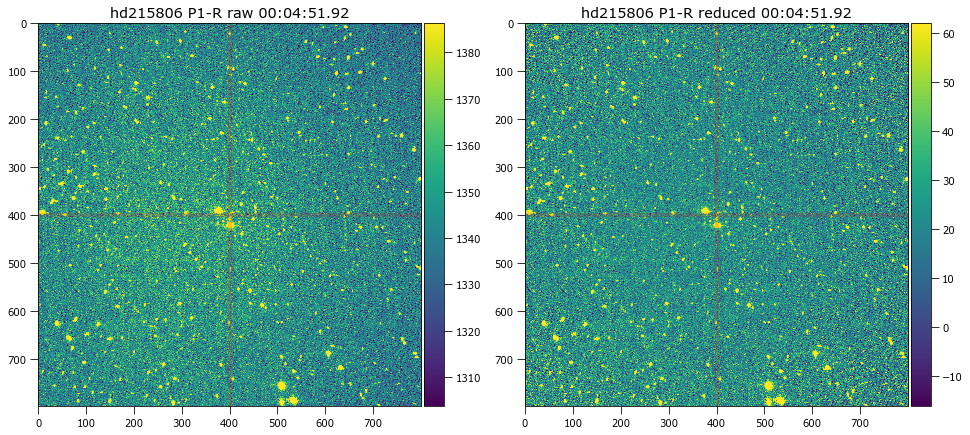

<Figure size 1008x1008 with 0 Axes>

In [33]:
k = 170
reduced_obj = funcs_calib_and_plot.plot_double_raw_v_reduced(astropy.io.fits.open(pol_std[k]),
                                    [512, 512, 400, 400], 
                                    (m_biast, m_dark, p_1_m_flat), 
                                    True, True, True)

229 peaks detected from image of size 1024 x 1024 with sigma: 4 and second threshold: 50
Targets within region of interest:  2


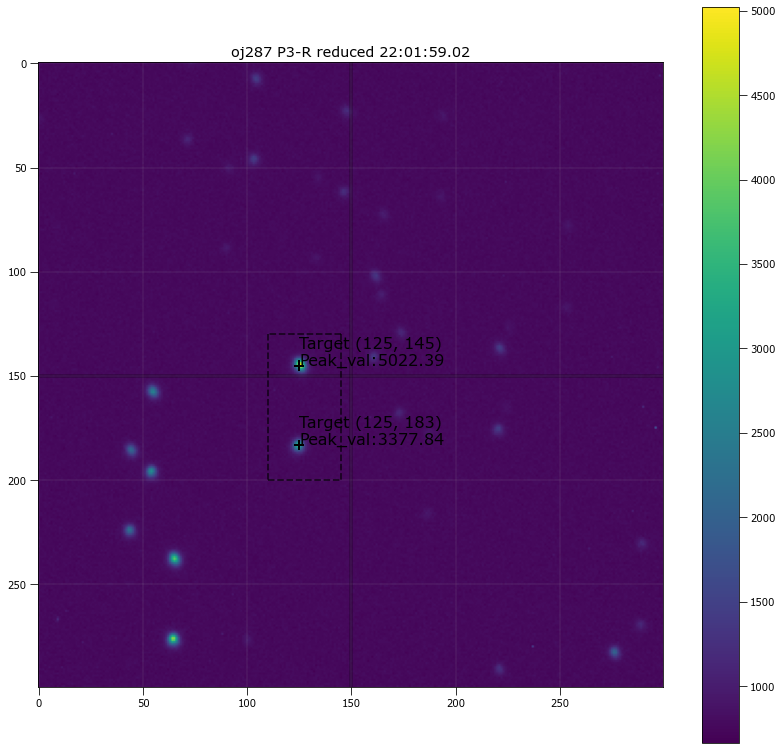

Aperture positions are: [(487, 507), (487, 545)] from the 1024 x 1024 image
Aperture positions are: [(125, 145), (125, 183)] from the 150 x 150 image


In [28]:
search_off = 150
search_bracket = [20, 50, 40, -5]
x_targ, y_targ, peak_targ  = funcs_polarimetry.source_peak_finder_pol_std(reduced_obj,4,search_bracket, 600 , False, True) #what do I return from this?
apt_pos = funcs_star_finder.plot_spotted(reduced_obj, search_off, search_bracket,x_targ, y_targ, peak_targ, True, False)

apt_positions = []
for h in range(0 , len(x_targ)):
    apt_positions.append((x_targ[h], y_targ[h])) #This must undergo some translation    
    
print("Aperture positions are:", apt_positions, "from the", reduced_obj[0].header['NAXIS1'], "x", reduced_obj[0].header['NAXIS2'], "image")
print("Aperture positions are:", apt_pos, "from the", str(search_off), "x", str(search_off) ,"image")

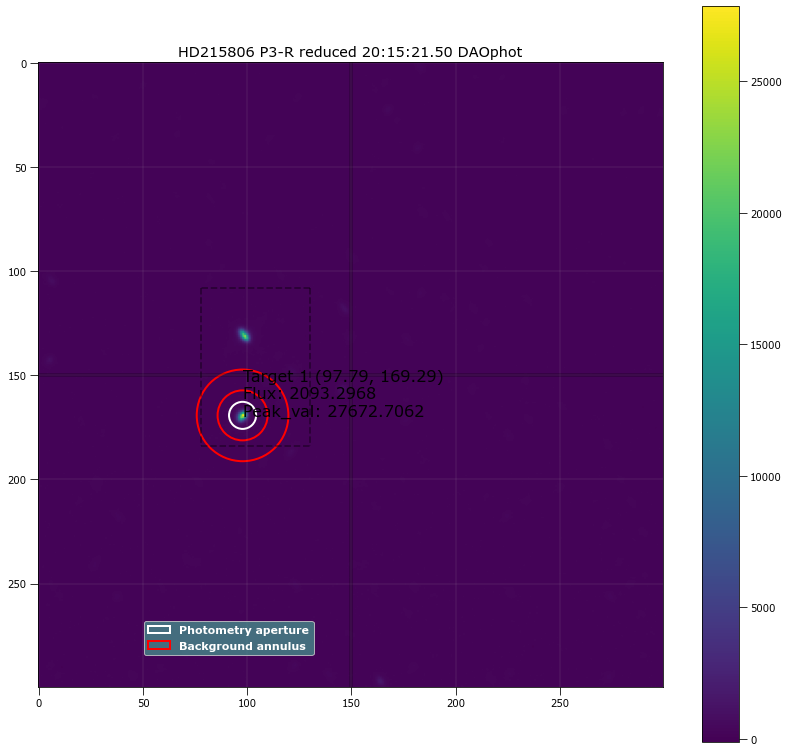

In [83]:
#DAO star finder
siegma_search = 1
DAO_positions = funcs_star_finder.dao_star_finder(reduced_obj, search_bracket, siegma_search , 1000, 150, 6.5, 12 , 22, True, False) #siegma and offset
#print("Positions of aperture from DAO",DAO_positions, "within the region of interest")
#phot_tab = funcs_apt_phot.apt_phot_local_bkg_sub(reduced_obj, 100, DAO_positions,  5.62, 11 , 17, False  )

In [11]:
#Its like an injection, make the output of the first star finder equal to the input of DAO starfinder

print("Results of the First Star Finder:")
print(apt_positions, "aperture positions from the", reduced_obj[0].header['NAXIS1'], "x", reduced_obj[0].header['NAXIS2'], "image")
print(apt_pos, "aperture positions from the", str(search_off), "x", str(search_off) ,"image")
print("\n")
print([list(x) for x in  DAO_positions], "\naperture positions from DAO positions")

Results of the First Star Finder:
[(533, 492), (485, 505), (558, 522), (510, 536)] aperture positions from the 1024 x 1024 image
[(171, 130), (123, 143), (196, 160), (148, 174)] aperture positions from the 150 x 150 image


[[123.0537785302438, 143.0542072406713], [147.91333858258204, 173.4163267738037]] 
aperture positions from DAO positions


Good radii: 4.559322033898305


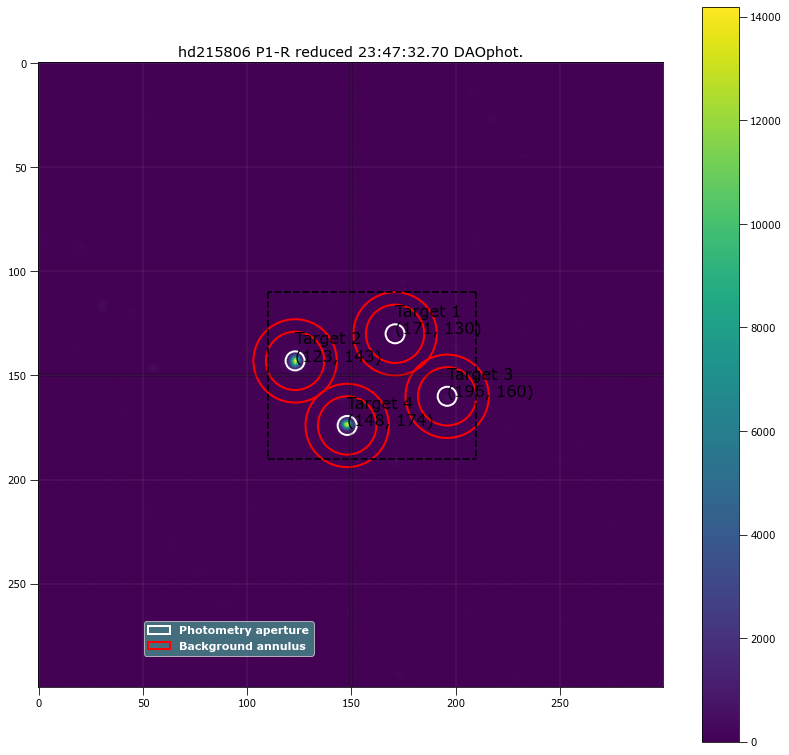

 id xcenter ycenter ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
      pix     pix   ...                                                     
--- ------- ------- ... ------------------ -------------- ------------------
  1     171     130 ...          175.65998      38936.627          158.06419
  2     123     143 ...          4055.9628      40917.198          165.30013
  3     196     160 ...          169.94514      39250.404          161.15725
  4     148     174 ...          3978.6688      44495.686          186.71545

 Aperture are: 65.30559781856107 Annulus Area: 640.8849013323178 

 id xcenter ycenter ... residual_aperture_sum_err residual_aperture_sum
      pix     pix   ...                                                
--- ------- ------- ... ------------------------- ---------------------
  1     171     130 ...                 159.55338             7742.9941
  2     123     143 ...                 4039.1189             230931.28
  3     196     160 ...          

In [12]:
trial_radii = np.linspace(3.0, 7, num=60) #tries different radii
target_a = []
target_b = []
target_c = []
target_d = []

for radii in trial_radii:
    #Its this loop thats taking up the compute time
    DAO_positions = funcs_star_finder.dao_star_finder(reduced_obj, search_bracket, siegma_search , 2500, 150, 5.62, 11 , 16, False, False) 
    
    #print("DAO positions original:", len(DAO_positions) )
    
    if (len(DAO_positions) != 4):
        DAO_positions = funcs_star_finder.peak_to_DAO(apt_pos)
    
    #print("New DAO positions:", len(DAO_positions))
    
    phot_tab = funcs_apt_phot.apt_phot_local_bkg_sub(reduced_obj, 150,search_bracket , DAO_positions, radii, 14 , 20, False,False)
    target_a.append(phot_tab['residual_aperture_sum'][0])
    target_b.append(phot_tab['residual_aperture_sum'][1])
    target_c.append(phot_tab['residual_aperture_sum'][2])
    target_d.append(phot_tab['residual_aperture_sum'][3])
    
combine_target = [target_a, target_b, target_c, target_d]

good_radii=funcs_apt_phot.solve_apt(combine_target, trial_radii, False)

print("Good radii:",good_radii)

phot_tab = funcs_apt_phot.apt_phot_local_bkg_sub(reduced_obj, 150, search_bracket ,DAO_positions,good_radii, 14 , 20, True, False)

In [8]:
#PIPE!

P1-R Filter


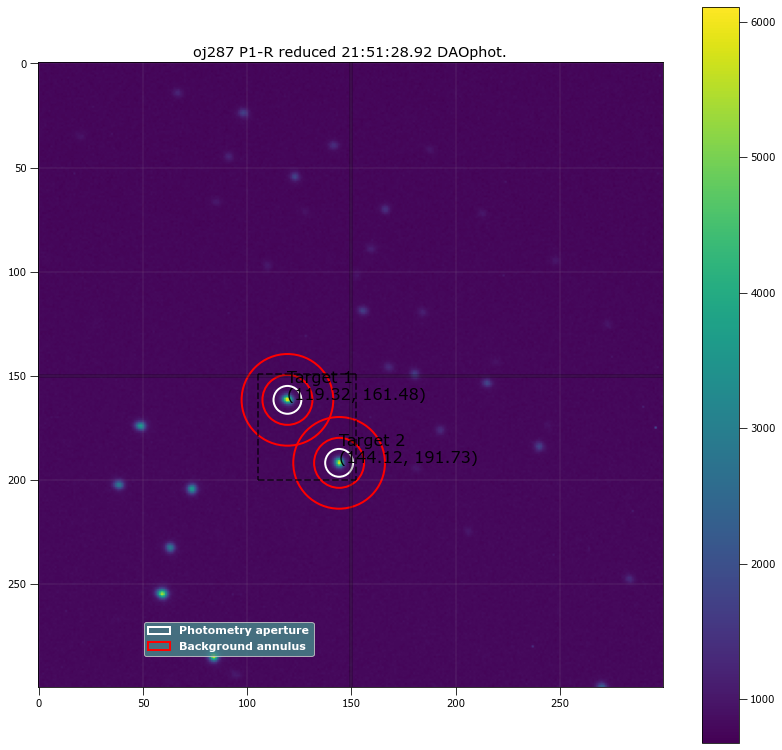

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 119.32331  161.4838 ...          2081.2624      842638.74          2579.3488
  2 144.12261 191.72857 ...          1972.2791      846422.45          2590.8533

 Aperture are: 140.3348345434486 Annulus Area: 1068.1415022205297 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 119.32331  161.4838 ...                 1742.3818              83756.22
  2 144.12261 191.72857 ...                  1631.887             76441.438

Write this out the excel
167 21:51:28.92 P1-R 120.0 6.683559322033898 119.3233104303256 161.48379589056134 83756.22026031087 1742.3817867455145 1

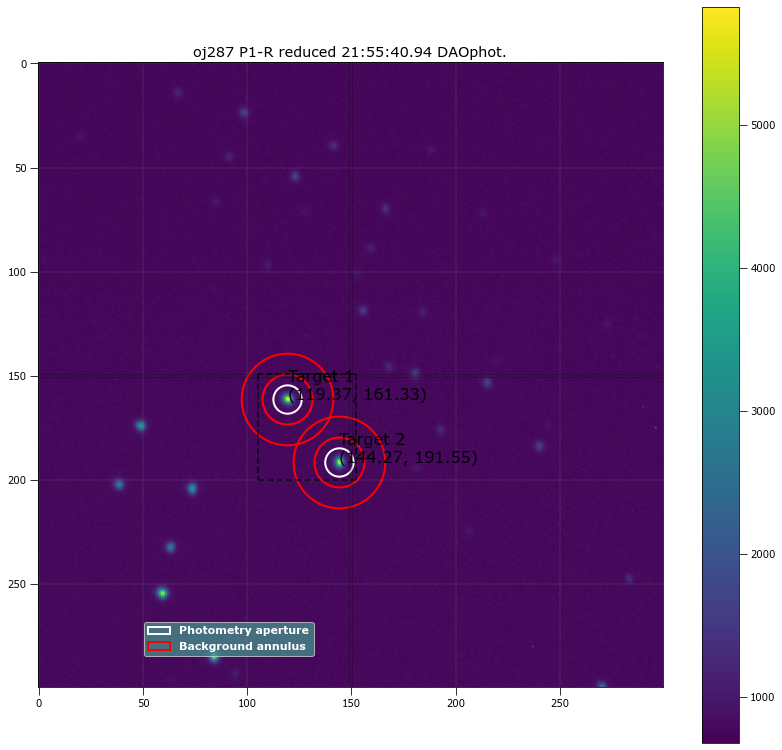

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 119.37131 161.32709 ...          2070.2254      843578.75          2582.1582
  2 144.26938 191.55387 ...          1961.9048      846885.39          2592.4096

 Aperture are: 145.31069737480098 Annulus Area: 1068.1415022205297 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 119.37131 161.32709 ...                 1718.9469             84220.917
  2 144.26938 191.55387 ...                 1609.2317             76858.164

Write this out the excel
168 21:55:40.94 P1-R 120.0 6.801016949152542 119.37130586394761 161.32709037436976 84220.91717220521 1718.9468747943283

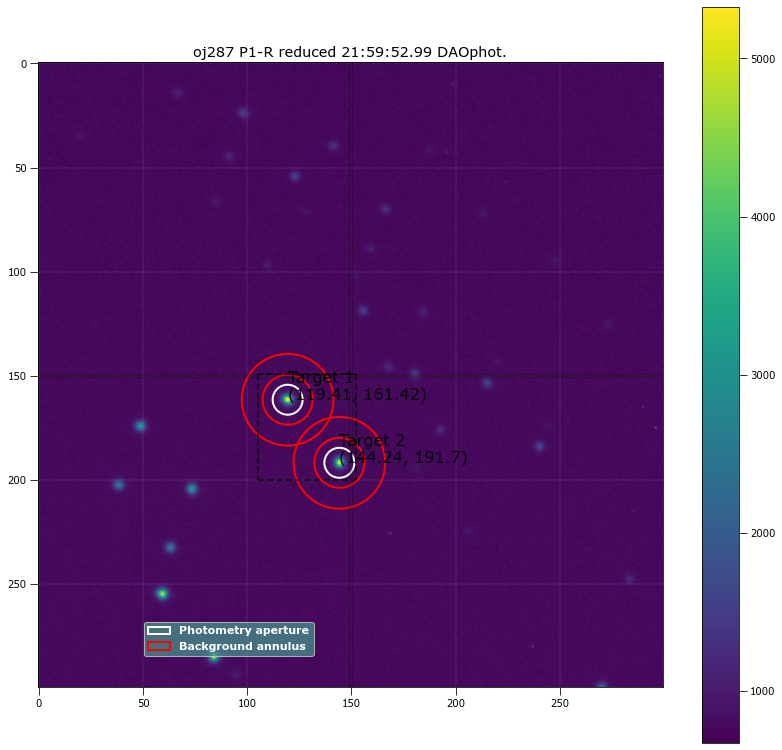

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 119.41494 161.42067 ...           2033.375       836772.8          2561.3806
  2 144.24473 191.70238 ...          1946.7517      837650.66          2564.0861

 Aperture are: 162.52296278295157 Annulus Area: 1068.1415022205297 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 119.41494 161.42067 ...                 1643.6484             83763.881
  2 144.24473 191.70238 ...                 1556.6134             77269.834

Write this out the excel
169 21:59:52.99 P1-R 120.0 7.192542372881356 119.41494161052682 161.42067296316716 83763.88123239955 1643.6483741217662

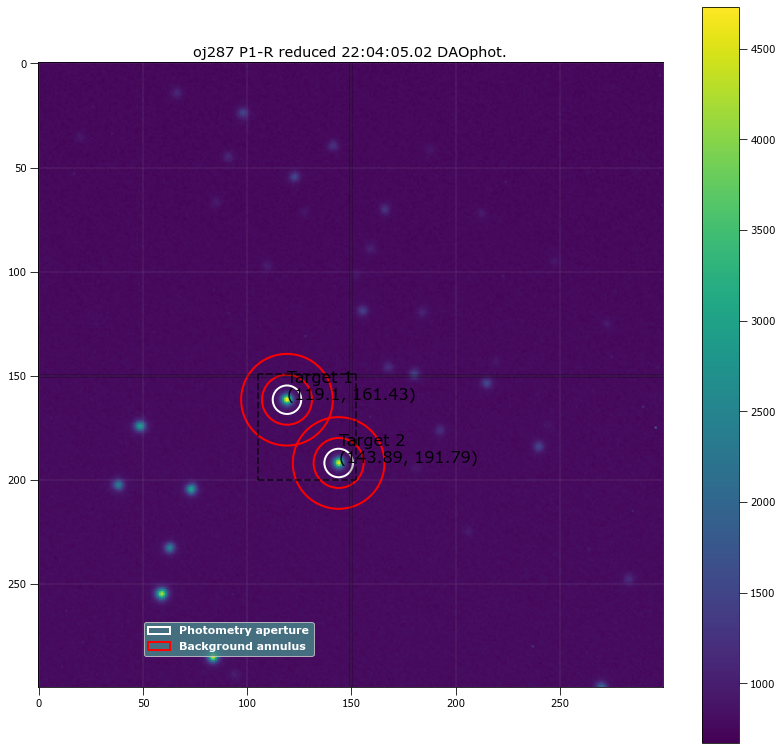

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1  119.0998 161.42525 ...          1938.2676       837662.7          2564.0979
  2 143.89205  191.7943 ...          1861.0469      842752.02          2579.6885

 Aperture are: 146.98858157921 Annulus Area: 1068.1415022205297 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1  119.0998 161.42525 ...                 1585.4182             82975.902
  2 143.89205  191.7943 ...                 1506.0521             75882.582

Write this out the excel
170 22:04:05.02 P1-R 120.0 6.840169491525423 119.09979757688758 161.4252512404103 82975.90167702439 1585.4182036272448 143

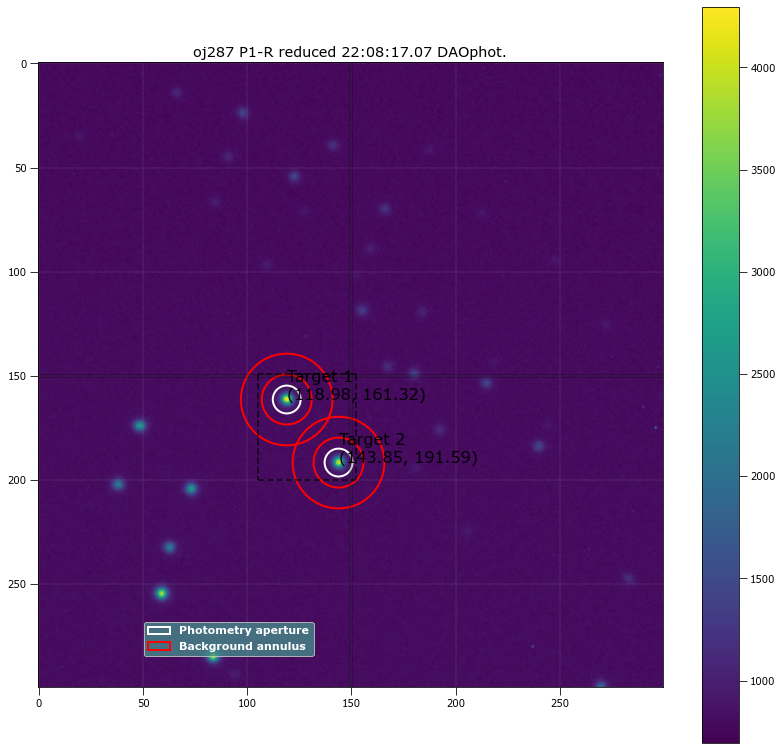

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 118.98156 161.32348 ...          1886.5786      859004.04          2629.4788
  2 143.85499 191.59415 ...           1806.974      862127.88          2639.0916

 Aperture are: 140.3348345434486 Annulus Area: 1068.1415022205297 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 118.98156 161.32348 ...                 1541.1118             81054.166
  2 143.85499 191.59415 ...                 1460.2442             74263.803

Write this out the excel
171 22:08:17.07 P1-R 120.0 6.683559322033898 118.98155551139813 161.3234773641052 81054.16582152007 1541.1117623414589 1

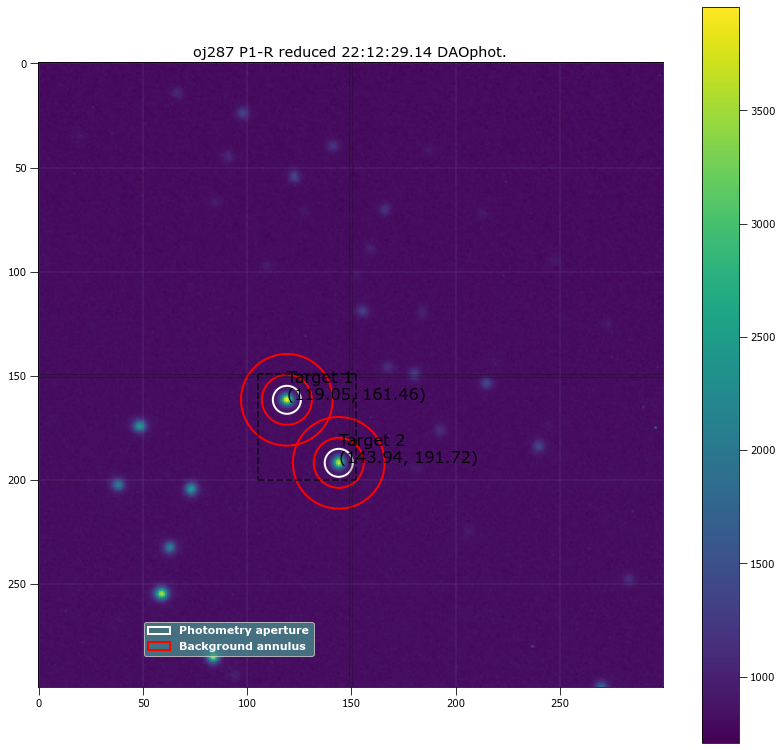

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 119.04973 161.46451 ...          1868.0771      873829.62          2674.7926
  2 143.94184 191.72473 ...           1793.584      878120.35           2687.941

 Aperture are: 141.98382385692028 Annulus Area: 1068.1415022205297 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 119.04973 161.46451 ...                 1512.5275              80543.05
  2 143.94184 191.72473 ...                 1436.2867             74214.676

Write this out the excel
172 22:12:29.14 P1-R 120.0 6.722711864406779 119.04972927416803 161.46451122188137 80543.04990263838 1512.5275018538134

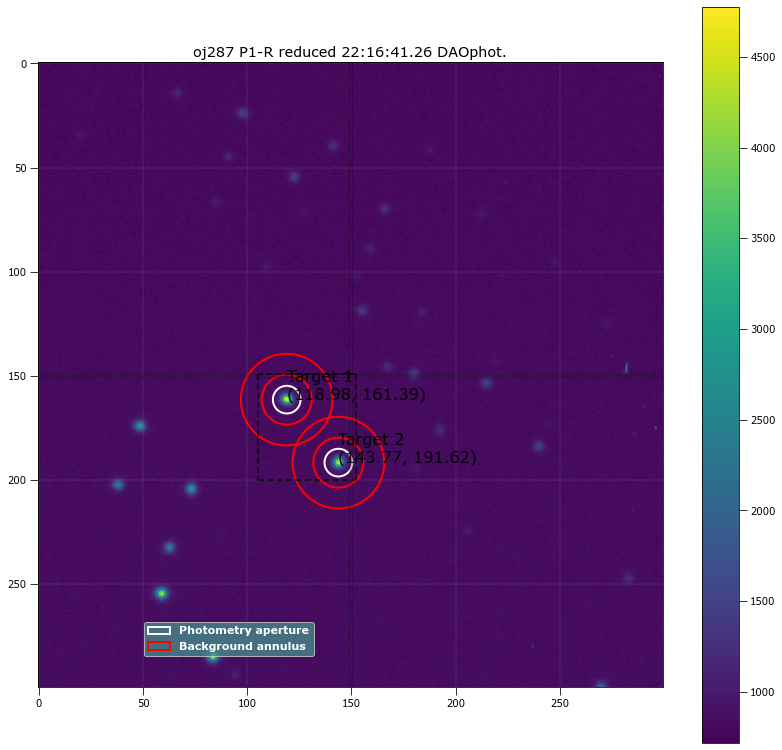

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 118.97955 161.38848 ...          1963.0601      893221.35          2734.0631
  2 143.76943 191.62061 ...          1870.6052      896995.06          2745.6527

 Aperture are: 138.69547686028938 Annulus Area: 1068.1415022205297 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 118.97955 161.38848 ...                 1608.0489             81096.466
  2 143.76943 191.62061 ...                 1514.0892             73775.896

Write this out the excel
173 22:16:41.26 P1-R 120.0 6.644406779661017 118.97955102069055 161.38848067208866 81096.46557712153 1608.0489193964434

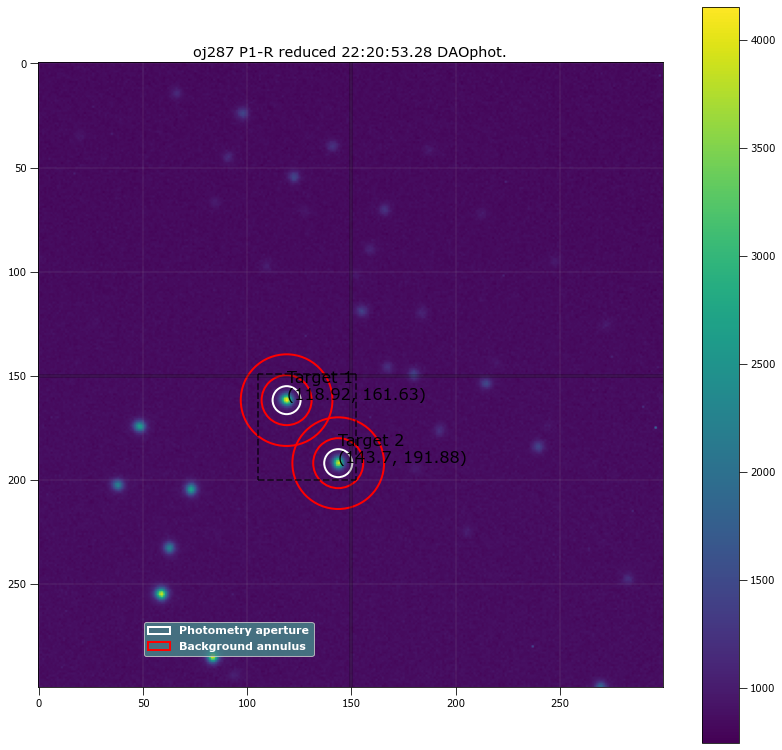

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 118.92153 161.62639 ...          1910.7162      917610.68          2808.6838
  2  143.6987 191.87663 ...          1834.3744      921362.55          2820.2139

 Aperture are: 141.98382385692028 Annulus Area: 1068.1415022205297 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 118.92153 161.62639 ...                  1537.369             79612.394
  2  143.6987 191.87663 ...                 1459.4945             72847.912

Write this out the excel
174 22:20:53.28 P1-R 120.0 6.722711864406779 118.92152765266349 161.62638816598601 79612.39383171037 1537.369000894333 

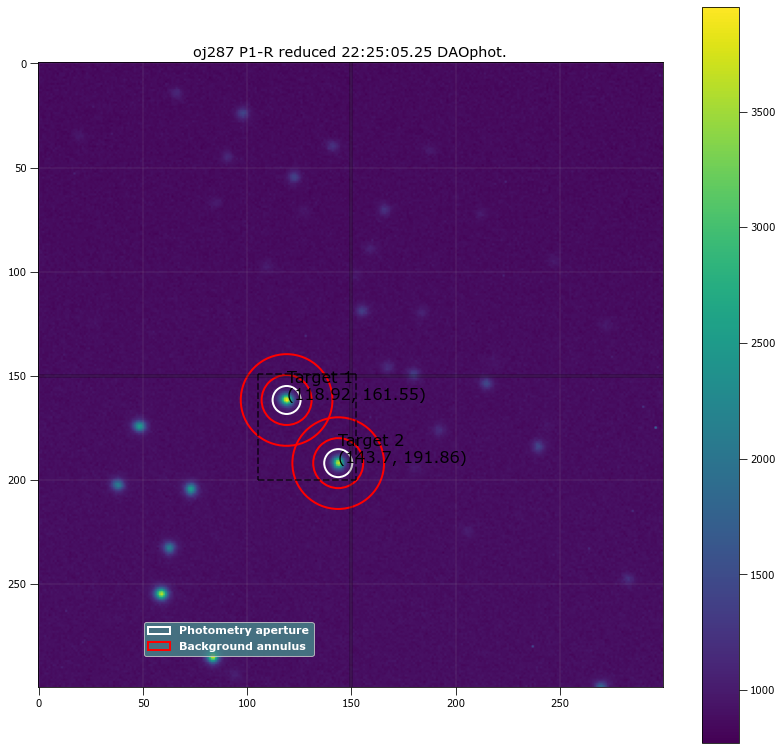

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 118.92115  161.5493 ...          1902.8916      944608.62          2891.3305
  2 143.69737 191.86251 ...          1826.8359      949119.41          2905.0603

 Aperture are: 141.98382385692028 Annulus Area: 1068.1415022205297 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 118.92115  161.5493 ...                 1518.5584             78629.516
  2 143.69737 191.86251 ...                 1440.6777             71892.839

Write this out the excel
175 22:25:05.25 P1-R 120.0 6.722711864406779 118.92114529624226 161.54930295738475 78629.51586999727 1518.5584438606254

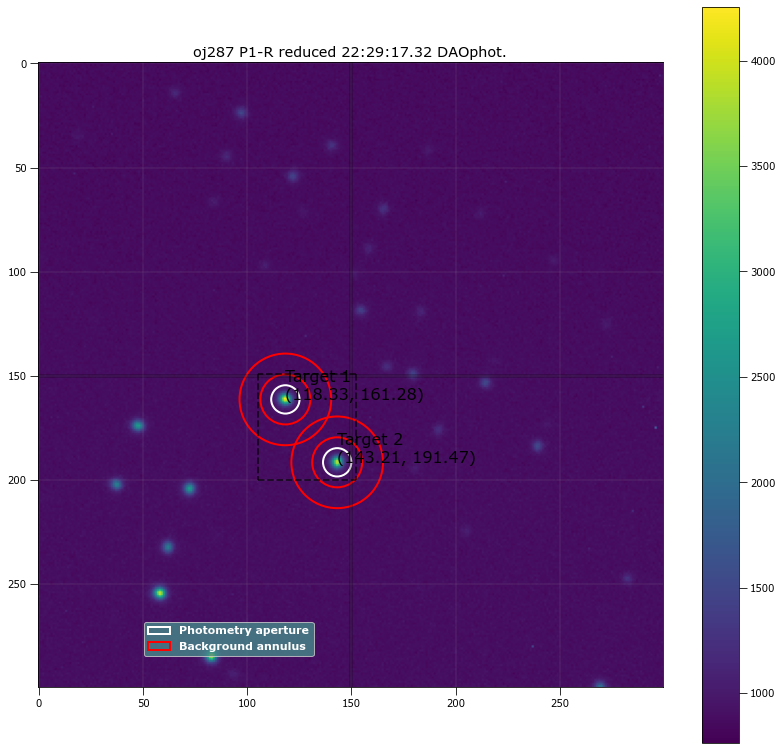

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 118.32742 161.27747 ...          1945.5569      948497.01          2903.2594
  2 143.20518 191.47237 ...          1870.5471      951325.58          2911.9598

 Aperture are: 145.31069737480098 Annulus Area: 1068.1415022205297 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 118.32742 161.27747 ...                 1550.5955             79056.335
  2 143.20518 191.47237 ...                 1474.4021             73182.953

Write this out the excel
176 22:29:17.32 P1-R 120.0 6.801016949152542 118.32742175821105 161.27746970460674 79056.33504480476 1550.5954908165804

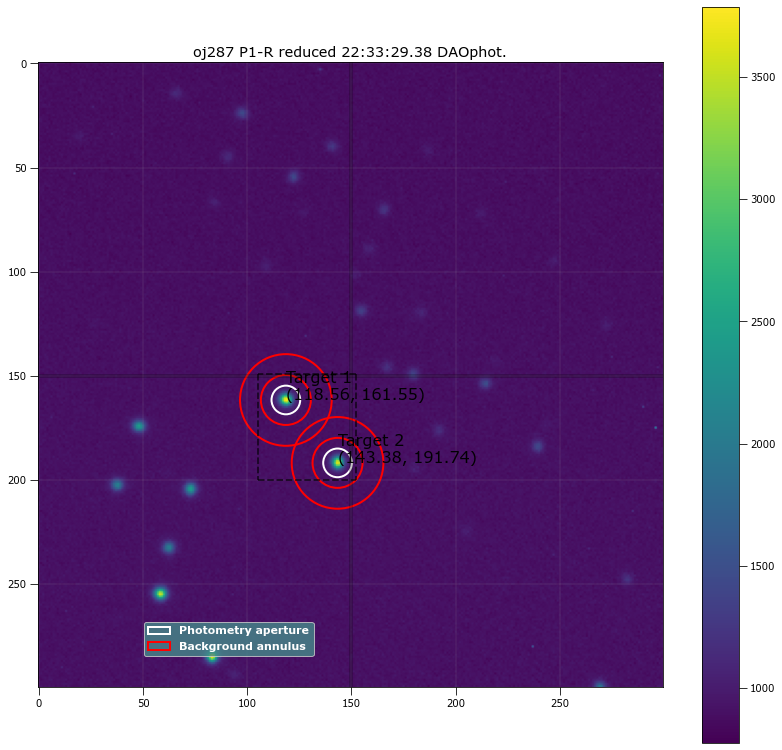

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 118.56471 161.54506 ...          1927.7568      964437.59          2951.9259
  2 143.37558  191.7403 ...          1863.9846      968563.97          2964.5713

 Aperture are: 148.6760974139315 Annulus Area: 1068.1415022205297 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 118.56471 161.54506 ...                 1516.8741             78068.005
  2 143.37558  191.7403 ...                 1451.3418               71842.3

Write this out the excel
177 22:33:29.38 P1-R 120.0 6.879322033898305 118.56471364893221 161.54506082234735 78068.00480252379 1516.8740977659513 

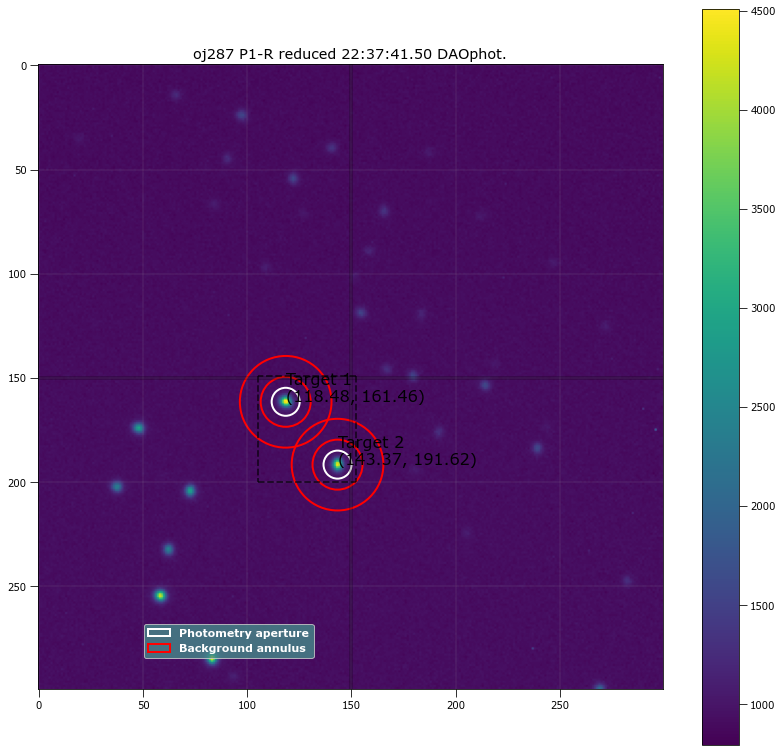

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 118.47614  161.4569 ...           2015.291      982850.82          3008.3341
  2 143.36748 191.62473 ...          1932.5585      985564.94           3016.641

 Aperture are: 141.98382385692028 Annulus Area: 1068.1415022205297 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 118.47614  161.4569 ...                  1615.405             79050.291
  2 143.36748 191.62473 ...                 1531.5683             71716.947

Write this out the excel
178 22:37:41.50 P1-R 120.0 6.722711864406779 118.47613648605702 161.4568958496594 79050.29065016247 1615.4050413112561 

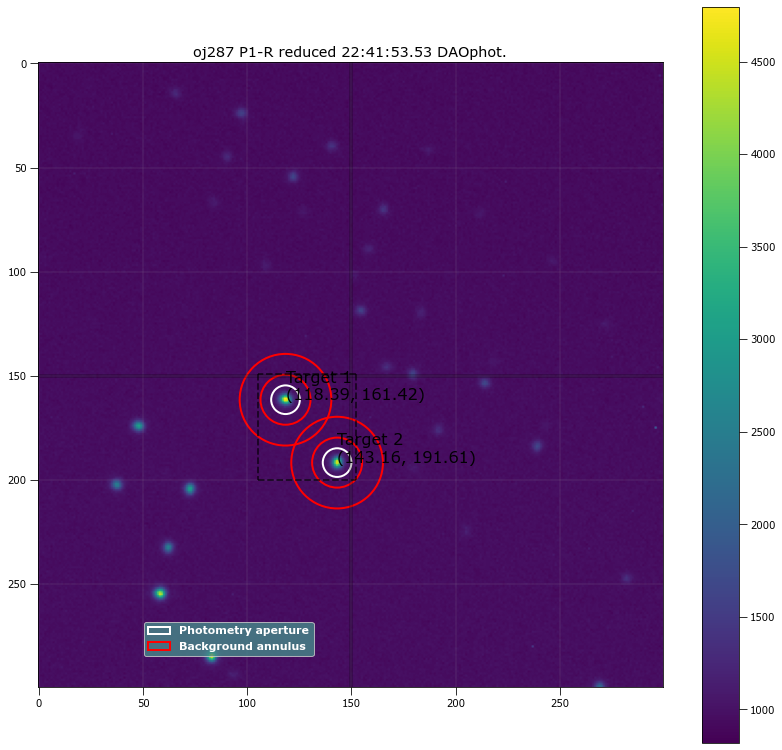

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 118.39247 161.42487 ...          2076.8803      1018820.4          3118.4094
  2 143.16388 191.61102 ...          1999.3547      1024001.3          3134.2578

 Aperture are: 148.6760974139315 Annulus Area: 1068.1415022205297 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 118.39247 161.42487 ...                 1642.8246             78692.142
  2 143.16388 191.61102 ...                  1563.093             71971.537

Write this out the excel
179 22:41:53.53 P1-R 120.0 6.879322033898305 118.3924701998579 161.4248676609247 78692.14184831441 1642.8245549268509 14

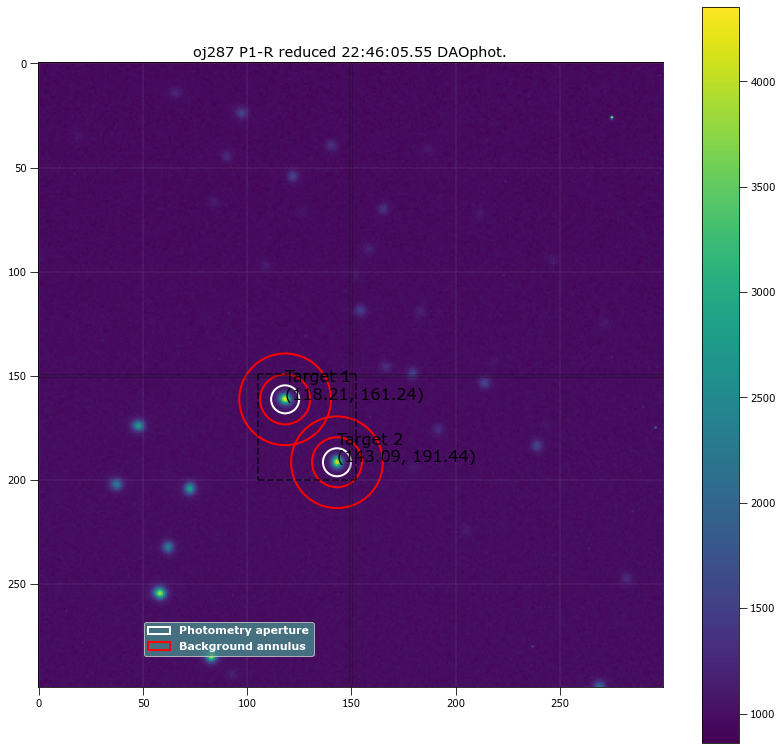

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 118.21269 161.23809 ...          2021.7168      1040910.4           3185.918
  2 143.08917 191.44336 ...          1955.6013      1045204.5          3199.1529

 Aperture are: 141.98382385692028 Annulus Area: 1068.1415022205297 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 118.21269 161.23809 ...                 1598.2253             76897.484
  2 143.08917 191.44336 ...                 1530.3506             70841.761

Write this out the excel
180 22:46:05.55 P1-R 120.0 6.722711864406779 118.21269223270846 161.23808846092297 76897.48370184403 1598.2252940522922

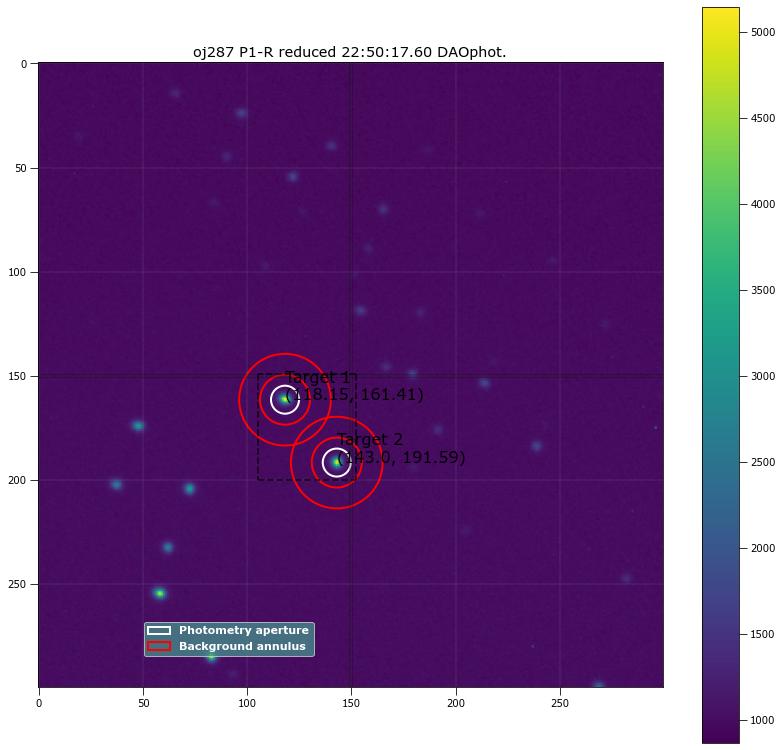

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 118.15338 161.40725 ...            2113.96      1065920.3          3262.4268
  2 143.00483 191.58941 ...          2044.9963      1071300.8          3278.9397

 Aperture are: 141.98382385692028 Annulus Area: 1068.1415022205297 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 118.15338 161.40725 ...                 1680.2985             77033.218
  2 143.00483 191.58941 ...                 1609.1398             70694.986

Write this out the excel
181 22:50:17.60 P1-R 120.0 6.722711864406779 118.15337709420507 161.40724848429207 77033.21760470522 1680.2984880430795

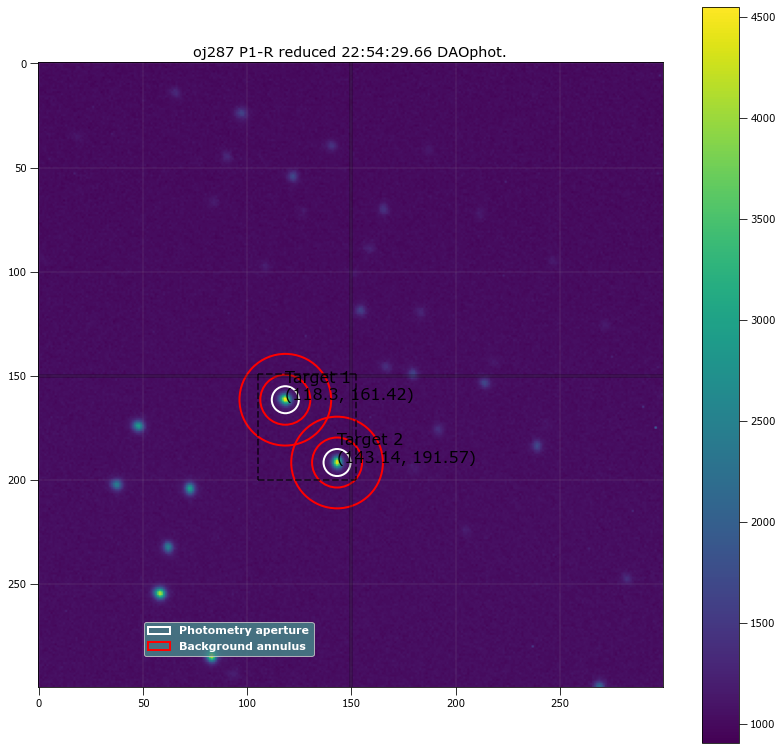

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 118.30361  161.4185 ...          2058.0424      1101640.5          3371.7446
  2 143.14389 191.56956 ...          1993.0743      1106199.7          3385.7334

 Aperture are: 132.23436243077697 Annulus Area: 1068.1415022205297 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 118.30361  161.4185 ...                 1640.6253             75143.504
  2 143.14389 191.56956 ...                 1573.9254             68934.206

Write this out the excel
182 22:54:29.66 P1-R 120.0 6.487796610169491 118.30360712627609 161.418500772712 75143.50435052582 1640.625334338463 14

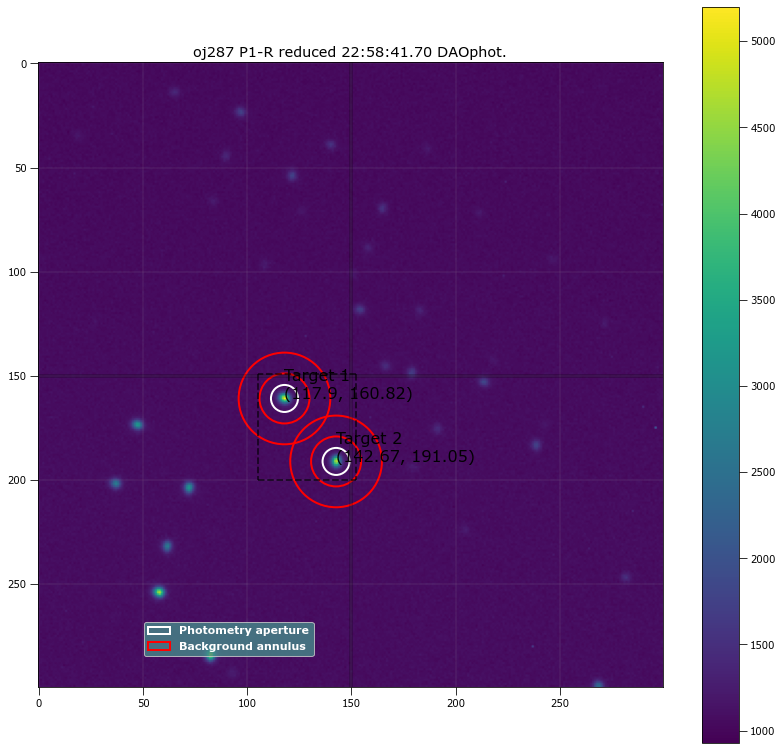

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 117.89967 160.81946 ...          2127.2261      1139620.6          3487.9775
  2 142.66784 191.04539 ...          2041.6016      1144641.5          3503.3588

 Aperture are: 132.23436243077697 Annulus Area: 1068.1415022205297 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 117.89967 160.81946 ...                 1695.4196             75245.762
  2 142.66784 191.04539 ...                 1607.8909              67950.97

Write this out the excel
183 22:58:41.70 P1-R 120.0 6.487796610169491 117.89967392567007 160.8194576165672 75245.76195944566 1695.4195608660848 

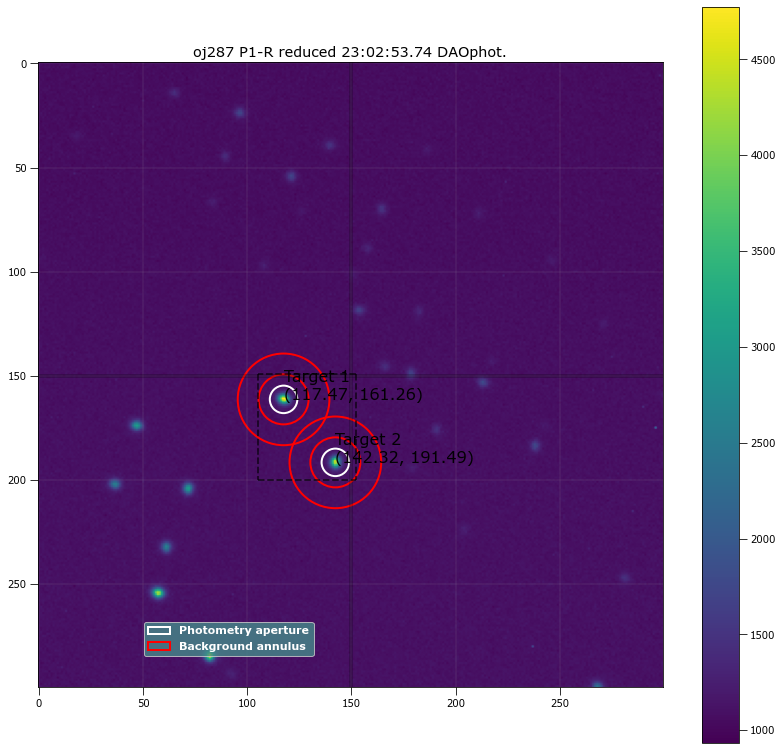

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 117.46608 161.25982 ...          2138.1495      1165568.4           3567.403
  2   142.322 191.49062 ...          2056.2092        1171060          3584.1353

 Aperture are: 137.06575080744258 Annulus Area: 1068.1415022205297 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 117.46608 161.25982 ...                 1680.3742             74547.801
  2   142.322 191.49062 ...                 1596.2868             67720.515

Write this out the excel
184 23:02:53.74 P1-R 120.0 6.605254237288135 117.46608257096742 161.25981912953443 74547.80082597121 1680.3741802447155

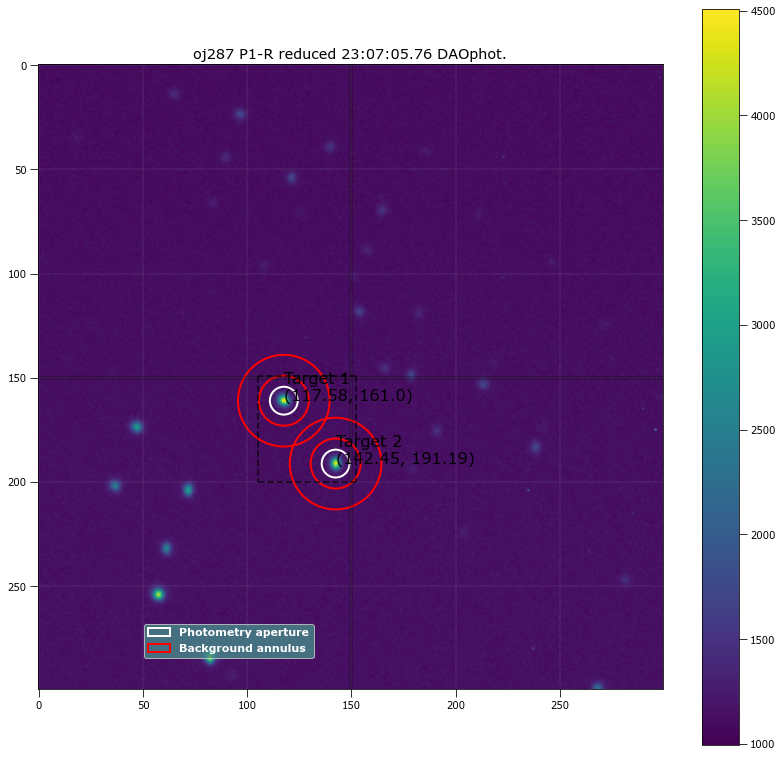

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 117.58447 160.99943 ...          2144.8809      1209108.1          3700.5713
  2 142.44802 191.19035 ...          2087.1099      1215166.1          3719.2437

 Aperture are: 140.3348345434486 Annulus Area: 1068.1415022205297 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 117.58447 160.99943 ...                 1658.6916              72643.26
  2 142.44802 191.19035 ...                 1598.4673             66961.668

Write this out the excel
185 23:07:05.76 P1-R 120.0 6.683559322033898 117.58447332655518 160.9994282490213 72643.26038609925 1658.69155432654 142

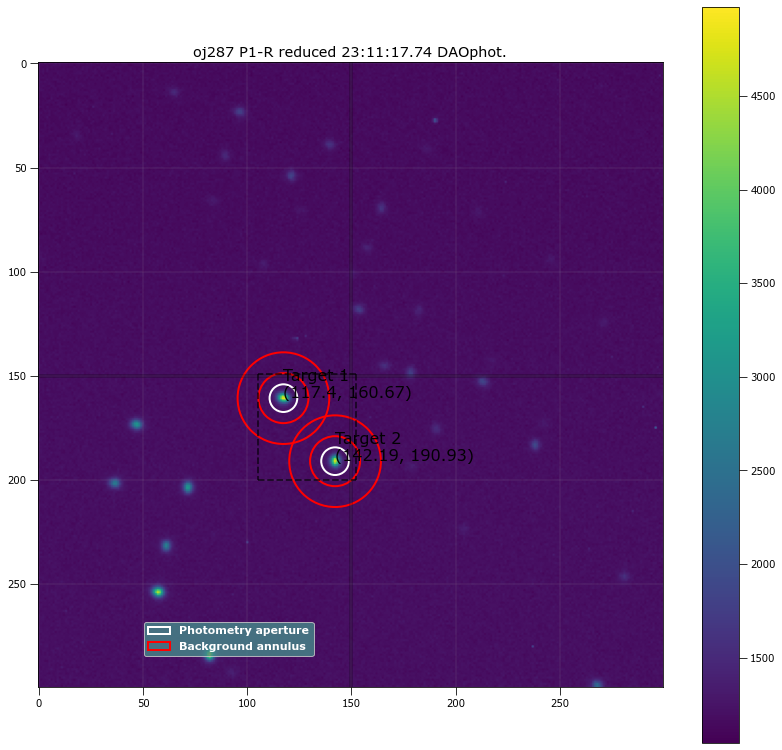

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 117.39774 160.66968 ...          2222.6917      1270696.4          3889.1089
  2 142.18953 190.92698 ...          2162.9557      1275192.7           3902.779

 Aperture are: 138.69547686028938 Annulus Area: 1068.1415022205297 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 117.39774 160.66968 ...                 1717.7008             72378.227
  2 142.18953 190.92698 ...                 1656.1897             66411.883

Write this out the excel
186 23:11:17.74 P1-R 120.0 6.644406779661017 117.39773845812032 160.66968186664 72378.22668064697 1717.7007549064515 14

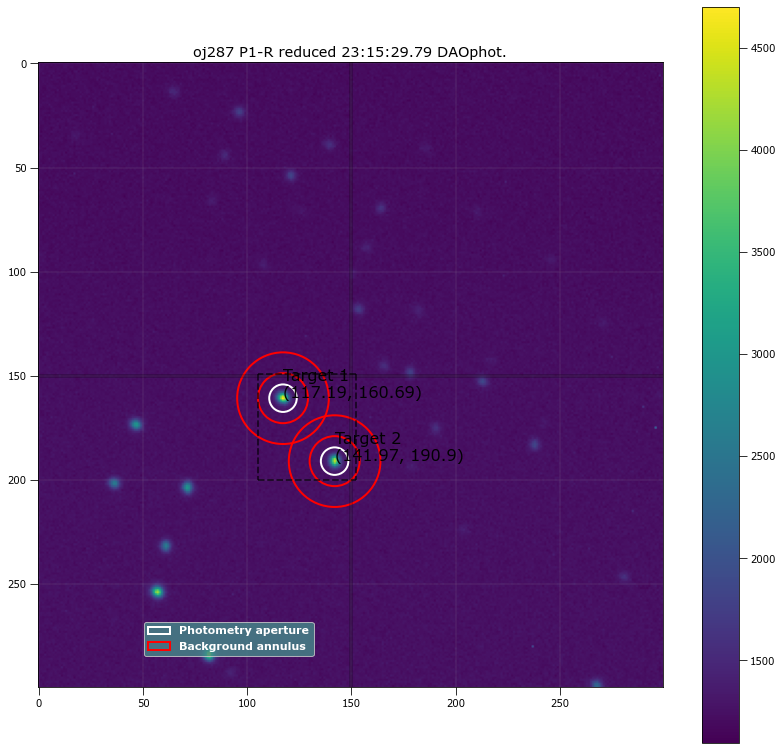

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 117.19131 160.68576 ...          2243.0979      1325686.7          4057.3091
  2 141.97292 190.90255 ...          2171.0738      1332075.3          4076.9442

 Aperture are: 137.06575080744258 Annulus Area: 1068.1415022205297 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 117.19131 160.68576 ...                 1722.4571             71396.167
  2 141.97292 190.90255 ...                 1647.9133             65101.205

Write this out the excel
187 23:15:29.79 P1-R 120.0 6.605254237288135 117.19130654862953 160.6857606513256 71396.16686856892 1722.457066379161 1

In [24]:
#The pipe!
#we expect 4 targets
#37 doesnt work
#Here is a work around. Incorporate the peak finder into the pipeline and tell the process such that if DAO cannot find the 
#targets, use the peak find coordinates. I suspect the problem is the FWHM.

#P1-R Filter
print("P1-R Filter")

res_apt_sum_list = []

start = 167
end = 188
filename = astropy.io.fits.open(pol_std[start])[0].header['OBJECT']+"_"+astropy.io.fits.open(pol_std[start])[0].header['FILTER']

workbook = xlsxwriter.Workbook('./stats/'+MJD+"_"+ filename+str(start)+"-" +str(end)  +'.xlsx')
worksheet = workbook.add_worksheet()
worksheet.write('A1', 'int')
worksheet.write('B1', 'time obs')
worksheet.write('C1', 'filter')
worksheet.write('D1', 'exptime')
worksheet.write('E1', 'aperture radius')
worksheet.write('F1', 'pol_std 1 x center')
worksheet.write('G1', 'pol_std 1 y center')
worksheet.write('H1', 'pol_std 1 counts')
worksheet.write('I1', 'pol_std 1 error')
worksheet.write('J1', 'pol_std 2 x center')
worksheet.write('K1', 'pol_std 2 y center')
worksheet.write('L1', 'pol_std 2 counts')
worksheet.write('M1', 'pol_std 2 error')
worksheet.write('N1', 'q')
worksheet.write('O1', 'q error')
worksheet.write('P1', 'u')
worksheet.write('Q1', 'u error')
worksheet.write('R1', 'PD')
worksheet.write('S1', 'PD error')
worksheet.write('T1', 'PA')
worksheet.write('U1', 'PA error')
row = 1
column = 0
search_off = 150
siegma_search = 3
search_bracket = [1, 50, 45, 2]

for k in range(start, end):
    reduced_obj = funcs_calib_and_plot.plot_double_raw_v_reduced(astropy.io.fits.open(pol_std[k]),
                                        [512, 512, 512, 512], 
                                        (m_biast, m_dark, p_1_m_flat), 
                                        False, True, False)

    trial_radii = np.linspace(5, 9.62, num=60)
    pol_std_a = []
    pol_std_b = []
    for radii in trial_radii:
        DAO_positions = funcs_star_finder.dao_star_finder(reduced_obj, search_bracket, siegma_search, 
                                                          700, search_off, radii, 12 , 22, False, False)
        
        if (len(DAO_positions) != 2):
            x_targ, y_targ, peak_targ  = funcs_polarimetry.source_peak_finder_pol_std(reduced_obj, 4, search_bracket, 650, False, False) #what do I return from this?
            apt_pos = funcs_star_finder.plot_spotted(reduced_obj, search_off, search_bracket , x_targ, y_targ, peak_targ, False, False)
            DAO_positions = funcs_star_finder.peak_to_DAO(apt_pos)        
        
        phot_tab = funcs_apt_phot.apt_phot_local_bkg_sub(reduced_obj, search_off, search_bracket, DAO_positions, radii, 12 , 22, False, False)
        pol_std_a.append(phot_tab['residual_aperture_sum'][0])
        pol_std_b.append(phot_tab['residual_aperture_sum'][1])

    combine_pol_std = [pol_std_a, pol_std_b]
    
    good_radii=funcs_apt_phot.solve_apt(combine_pol_std, trial_radii, False)

    phot_tab = funcs_apt_phot.apt_phot_local_bkg_sub(reduced_obj, search_off, search_bracket, DAO_positions,good_radii, 12 , 22, True, False)

    res_apt_sum_list.append(phot_tab['residual_aperture_sum'])
    
    print("\nWrite this out the excel")
    print(k, 
          astropy.io.fits.open(pol_std[k])[0].header['TIME-OBS'],
          astropy.io.fits.open(pol_std[k])[0].header['FILTER'],
          astropy.io.fits.open(pol_std[k])[0].header['EXPTIME'],
          good_radii,
          phot_tab['xcenter'][0].value, phot_tab['ycenter'][0].value,
          phot_tab['residual_aperture_sum'][0], phot_tab['residual_aperture_sum_err'][0],
          phot_tab['xcenter'][1].value, phot_tab['ycenter'][1].value,
          phot_tab['residual_aperture_sum'][1], phot_tab['residual_aperture_sum_err'][1],"\n")
    
    write_this = [k, 
          astropy.io.fits.open(pol_std[k])[0].header['TIME-OBS'],
          astropy.io.fits.open(pol_std[k])[0].header['FILTER'],
          astropy.io.fits.open(pol_std[k])[0].header['EXPTIME'],
          good_radii,
          phot_tab['xcenter'][0].value, phot_tab['ycenter'][0].value,
          phot_tab['residual_aperture_sum'][0], phot_tab['residual_aperture_sum_err'][0],
          phot_tab['xcenter'][1].value, phot_tab['ycenter'][1].value,
          phot_tab['residual_aperture_sum'][1], phot_tab['residual_aperture_sum_err'][1]] #,

    for item in write_this :
        worksheet.write(row, column, item)
        column += 1
        
    column = 0
    row += 1
    
workbook.close()

pol_std_1 = []
pol_std_2 = []

for things in res_apt_sum_list:
    pol_std_1.append(things[0])
    pol_std_2.append(things[1])

P3-R Filter
Aperture radius for 21:53:34.93 is 6.746610169491525


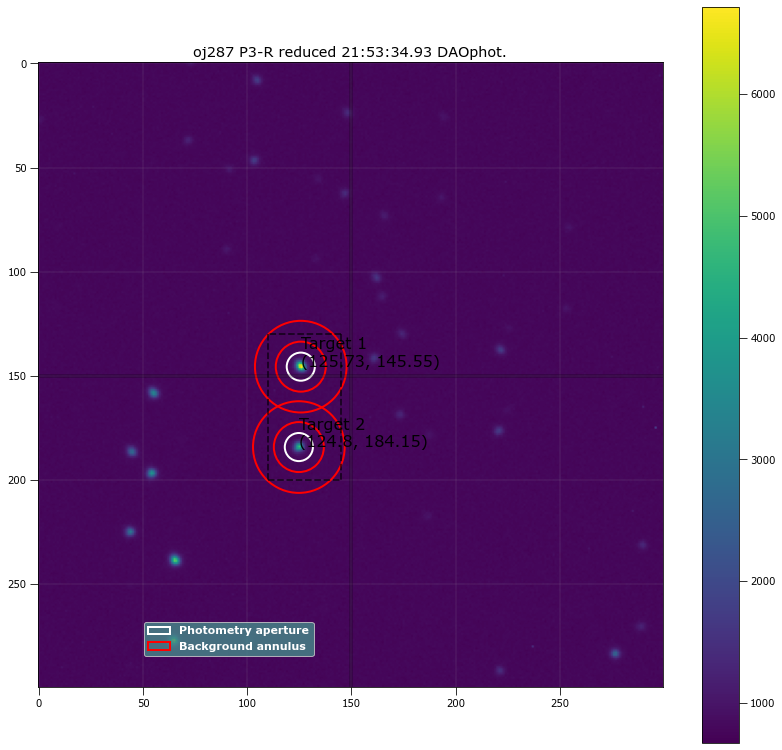

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 125.72509 145.54841 ...          2291.3104       833332.3          2551.0976
  2 124.79716 184.14918 ...          1713.3913       833388.3          2551.1324

 Aperture are: 142.99508357967025 Annulus Area: 1068.1415022205297 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 125.72509 145.54841 ...                 1949.7878             98111.139
  2 124.79716 184.14918 ...                 1371.8641             60477.357

Write this out the excel
188 21:53:34.93 P3-R 120.0 6.746610169491525 125.72509415274294 145.5484107271813 98111.13862971788 1949.7878210012277 

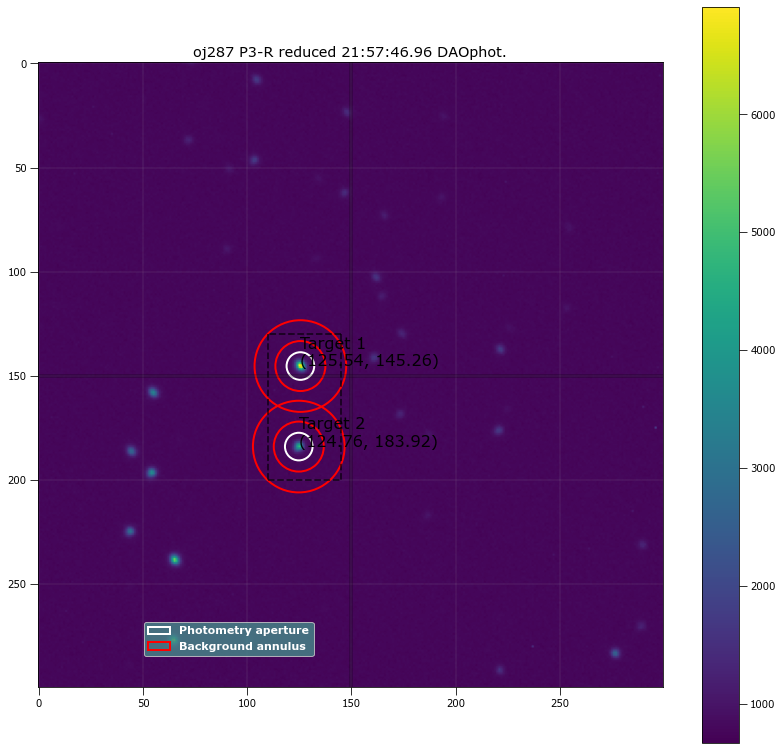

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1  125.5353 145.25908 ...          2299.1622      832852.36          2549.5249
  2 124.76199 183.91576 ...          1699.5098      830112.38          2541.0565

 Aperture are: 138.10173480120147 Annulus Area: 1068.1415022205297 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1  125.5353 145.25908 ...                   1969.53              97864.91
  2 124.76199 183.91576 ...                 1370.9725             60436.935

Write this out the excel
189 21:57:46.96 P3-R 120.0 6.6301694915254235 125.53530114865481 145.25908149741946 97864.9097714009 1969.5299696411753

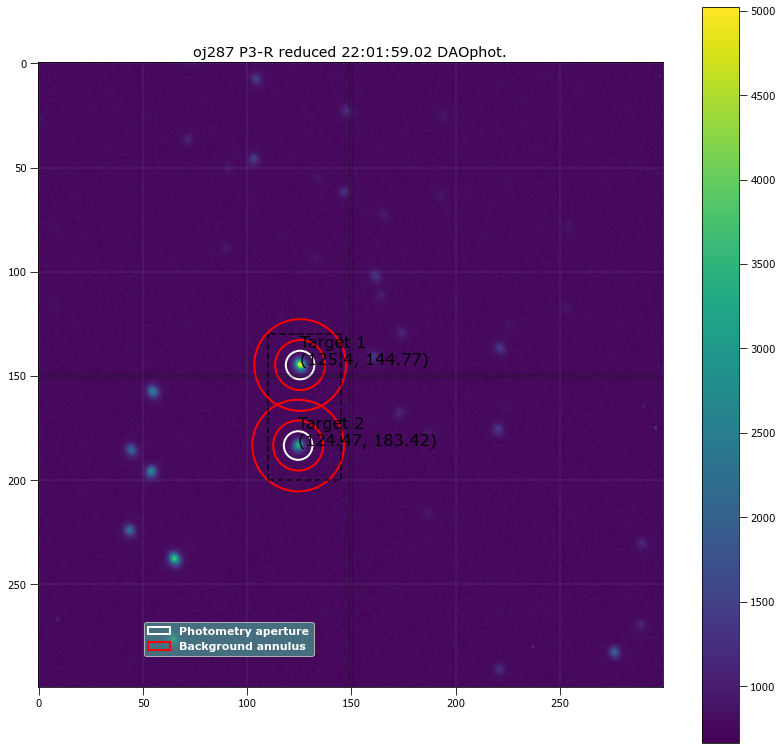

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 125.40146 144.76839 ...          2065.3747      824514.04          2524.1422
  2 124.46815 183.41582 ...           1593.352      822094.03          2516.5482

 Aperture are: 147.9736224956352 Annulus Area: 1068.1415022205297 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 125.40146 144.76839 ...                 1715.6959              96213.74
  2 124.46815 183.41582 ...                 1244.7252              59793.95

Write this out the excel
190 22:01:59.02 P3-R 120.0 6.863050847457627 125.40146497964359 144.76838686510274 96213.74017258422 1715.6958555358597 

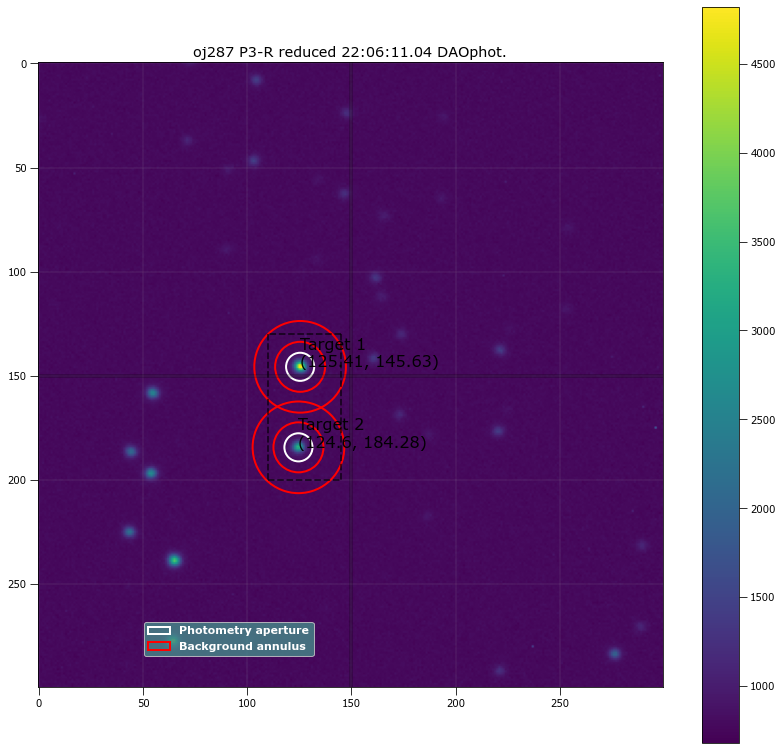

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 125.41157 145.62704 ...           2050.869      835989.67           2559.231
  2 124.60402 184.27799 ...          1587.3977      832267.92          2547.5874

 Aperture are: 142.99508357967025 Annulus Area: 1068.1415022205297 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 125.41157 145.62704 ...                 1708.2576             94834.575
  2 124.60402 184.27799 ...                 1246.3451              59284.26

Write this out the excel
191 22:06:11.04 P3-R 120.0 6.746610169491525 125.41156742551622 145.62703678417668 94834.57469043175 1708.2576265413852

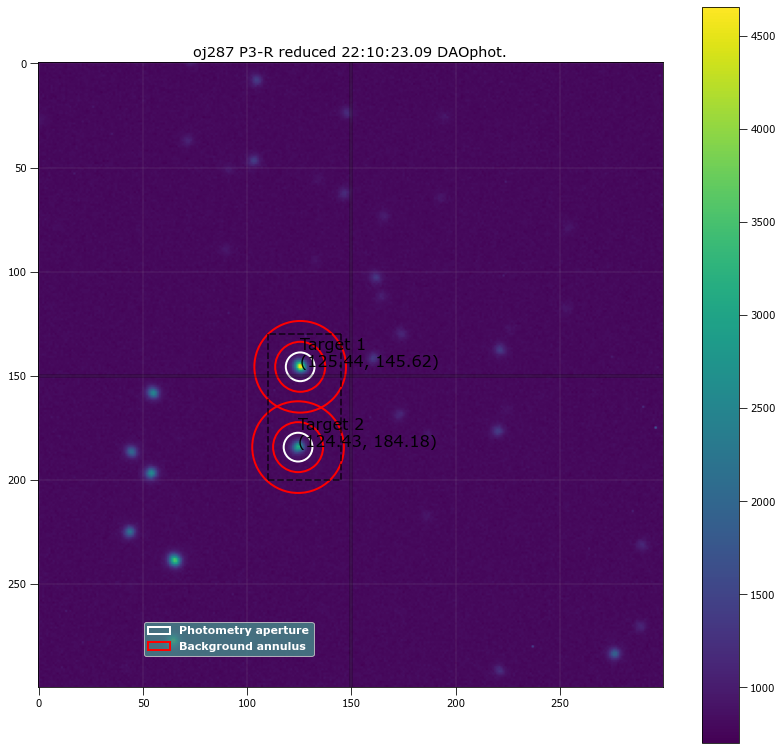

 id xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
      pix       pix    ...                                                     
--- -------- --------- ... ------------------ -------------- ------------------
  1 125.4431 145.61911 ...           2048.715       851581.7          2606.8692
  2 124.4264 184.18246 ...          1587.0045      852749.25          2610.3119

 Aperture are: 149.65206660928934 Annulus Area: 1068.1415022205297 

 id xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
      pix       pix    ...                                                
--- -------- --------- ... ------------------------- ---------------------
  1 125.4431 145.61911 ...                 1683.4794             95135.809
  2 124.4264 184.18246 ...                 1221.2865             57964.555

Write this out the excel
192 22:10:23.09 P3-R 120.0 6.90186440677966 125.44309641642234 145.6191093187737 95135.80883230217 1683.4793789642704 124.4263962

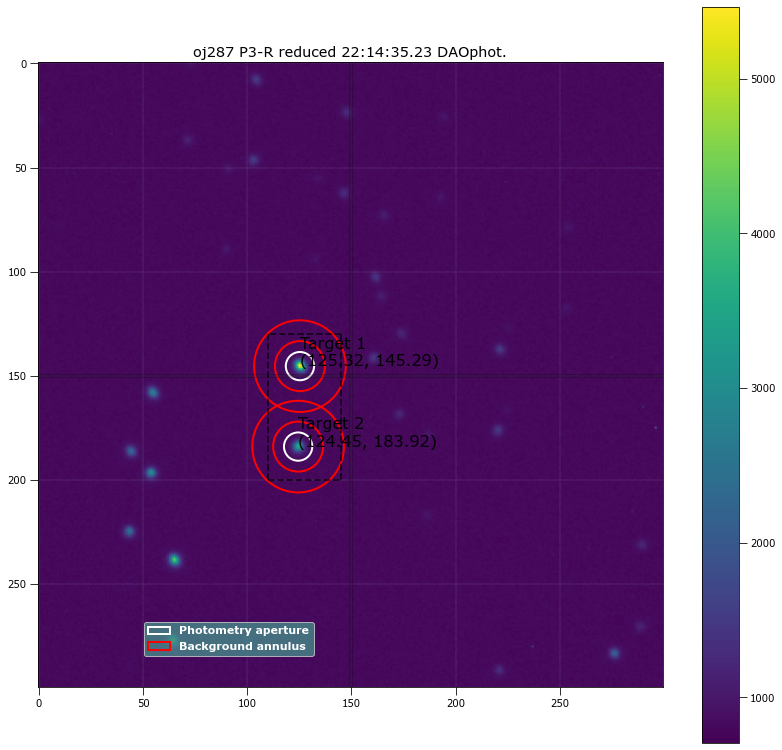

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 125.32238 145.29488 ...          2138.7641      874237.84          2676.2328
  2 124.44992 183.92318 ...          1644.2684      871526.32          2667.6409

 Aperture are: 144.64513098082566 Annulus Area: 1068.1415022205297 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 125.32238 145.29488 ...                 1776.3552             94986.111
  2 124.44992 183.92318 ...                 1283.0229             58590.947

Write this out the excel
193 22:14:35.23 P3-R 120.0 6.7854237288135595 125.3223808741085 145.29487733511831 94986.11145412519 1776.3551505999096

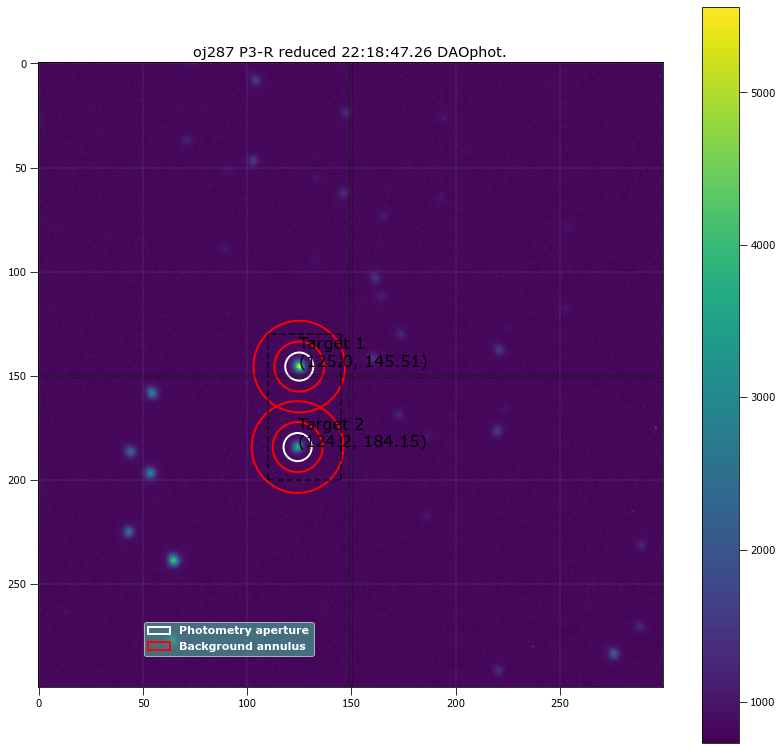

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 125.00163 145.51269 ...          2154.4755      891747.13          2729.7202
  2     124.2 184.15311 ...          1662.0227      891533.41          2728.9123

 Aperture are: 142.99508357967025 Annulus Area: 1068.1415022205297 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 125.00163 145.51269 ...                 1789.0403             94524.154
  2     124.2 184.15311 ...                 1296.6956             57564.813

Write this out the excel
194 22:18:47.26 P3-R 120.0 6.746610169491525 125.00163320819868 145.51268821878594 94524.15405394457 1789.04028192 124.

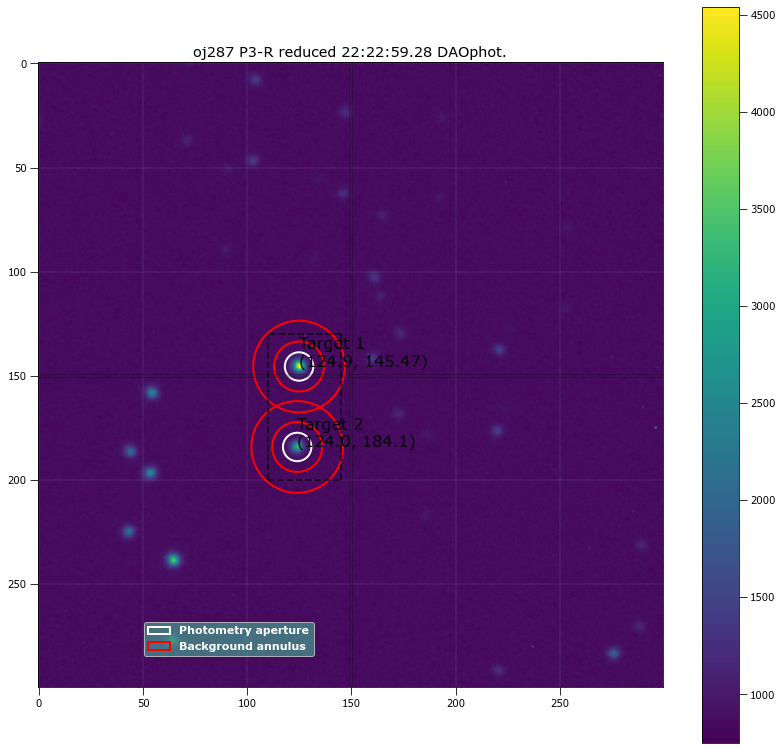

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 124.89679 145.47142 ...          2062.8025      917998.22          2810.0451
  2 124.00066 184.10275 ...          1631.8092      919113.28          2813.2988

 Aperture are: 146.30464395281396 Annulus Area: 1068.1415022205297 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 124.89679 145.47142 ...                 1677.9072             92191.041
  2 124.00066 184.10275 ...                 1246.4682              56250.18

Write this out the excel
195 22:22:59.28 P3-R 120.0 6.824237288135593 124.89679277615586 145.47142494091196 92191.04111230193 1677.907197995417 

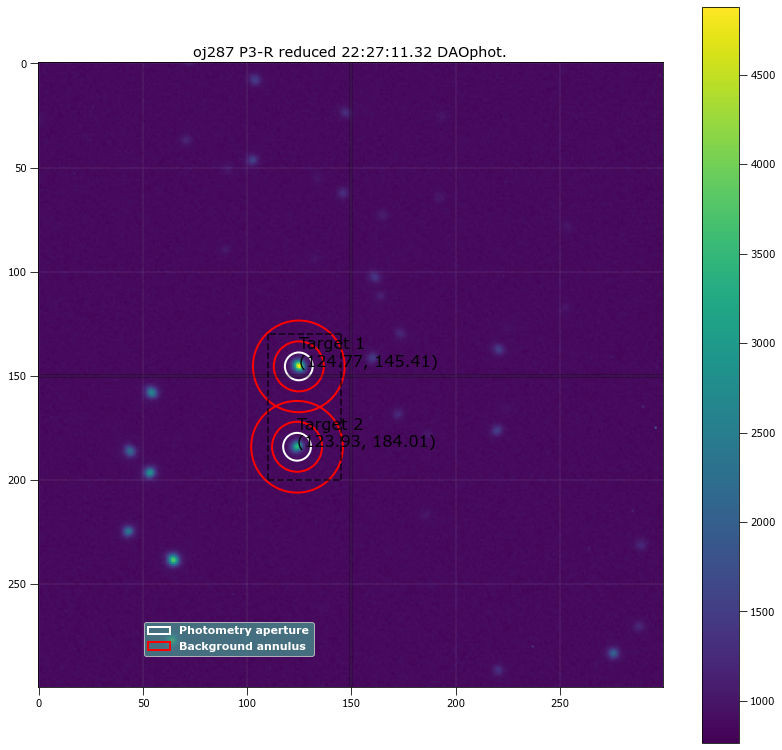

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 124.76934 145.41454 ...          2112.0745      931777.14          2852.2383
  2 123.93321 184.00752 ...          1664.0779      929752.36          2845.8876

 Aperture are: 139.72338548985815 Annulus Area: 1068.1415022205297 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 124.76934 145.41454 ...                 1738.9738             92084.865
  2 123.93321 184.00752 ...                 1291.8079             57303.676

Write this out the excel
196 22:27:11.32 P3-R 120.0 6.668983050847458 124.76934071368446 145.41453948864063 92084.86493365308 1738.9737686643198

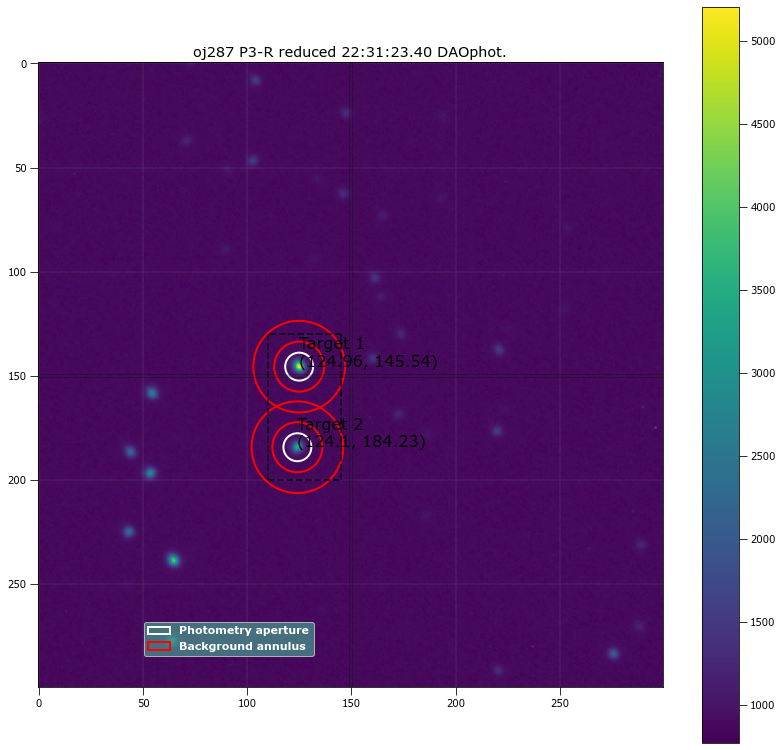

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 124.95531 145.54284 ...          2137.4857      937265.49          2869.0475
  2 124.09568 184.22952 ...          1667.4748      935385.93          2863.1031

 Aperture are: 141.35450174934775 Annulus Area: 1068.1415022205297 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 124.95531 145.54284 ...                 1757.8049             92212.071
  2 124.09568 184.22952 ...                 1288.5807             56642.265

Write this out the excel
197 22:31:23.40 P3-R 120.0 6.707796610169492 124.95531207741978 145.54284417135096 92212.07109776471 1757.8049172825176

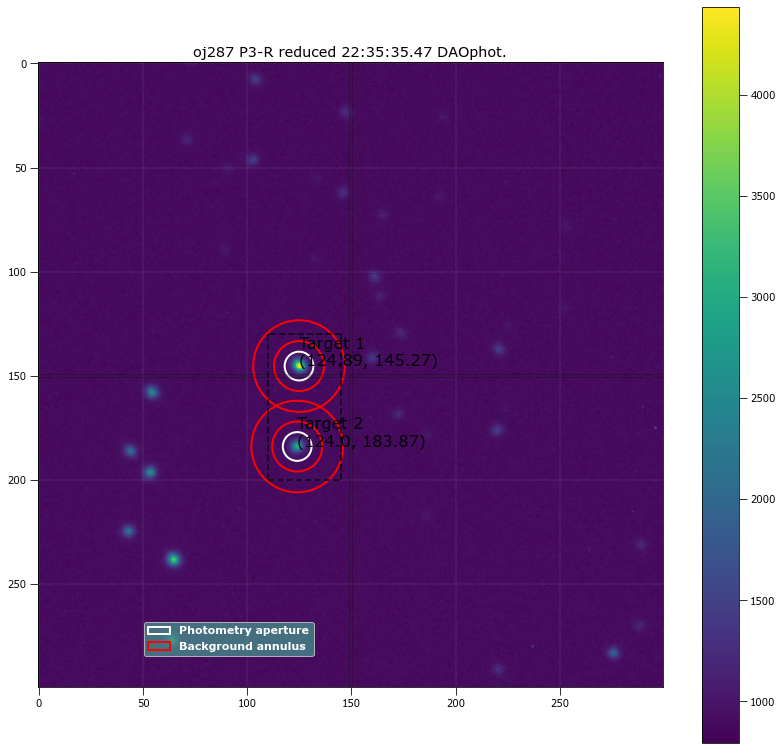

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1  124.8893  145.2735 ...          2091.8552         961176          2942.1066
  2 124.00369 183.87449 ...          1669.9188      962055.74          2944.6245

 Aperture are: 149.65206660928934 Annulus Area: 1068.1415022205297 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1  124.8893  145.2735 ...                 1679.6511             91594.175
  2 124.00369 183.87449 ...                 1257.3619             55962.278

Write this out the excel
198 22:35:35.47 P3-R 120.0 6.90186440677966 124.88929633468479 145.27350430381475 91594.17488755885 1679.651059977784 1

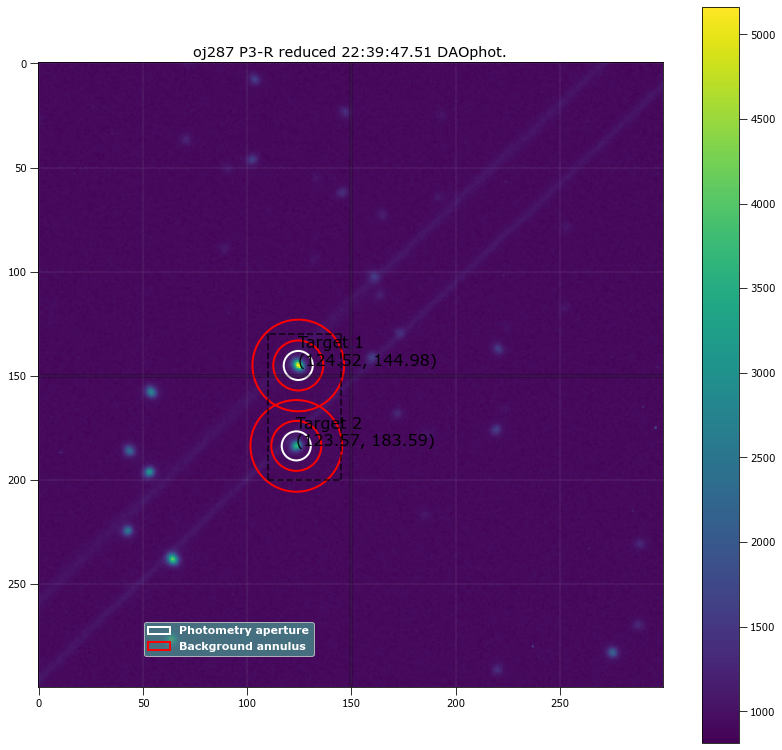

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 124.51822 144.97848 ...          2227.9323      999865.87          3061.9383
  2 123.56525 183.58553 ...          1790.3623      995891.79          3049.7107

 Aperture are: 153.03735154909646 Annulus Area: 1068.1415022205297 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 124.51822 144.97848 ...                 1789.2349             94537.977
  2 123.56525 183.58553 ...                 1353.4168             59848.456

Write this out the excel
199 22:39:47.51 P3-R 120.0 6.979491525423729 124.51821790489055 144.9784828724186 94537.97670633072 1789.234862310182 1

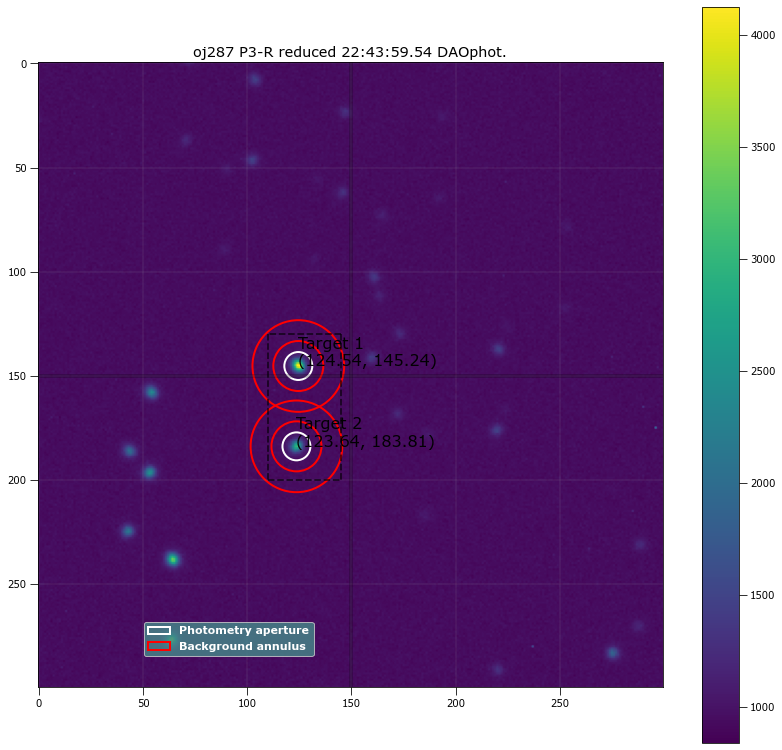

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 124.53886 145.24304 ...          2063.8303      1011069.3          3094.7155
  2 123.64276 183.80774 ...          1675.3426      1010357.2          3092.4192

 Aperture are: 141.35450174934775 Annulus Area: 1068.1415022205297 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 124.53886 145.24304 ...                 1654.2854              87362.58
  2 123.64276 183.80774 ...                 1266.1016             53988.692

Write this out the excel
200 22:43:59.54 P3-R 120.0 6.707796610169492 124.53886151937753 145.24304275325056 87362.57953387947 1654.2853702493203

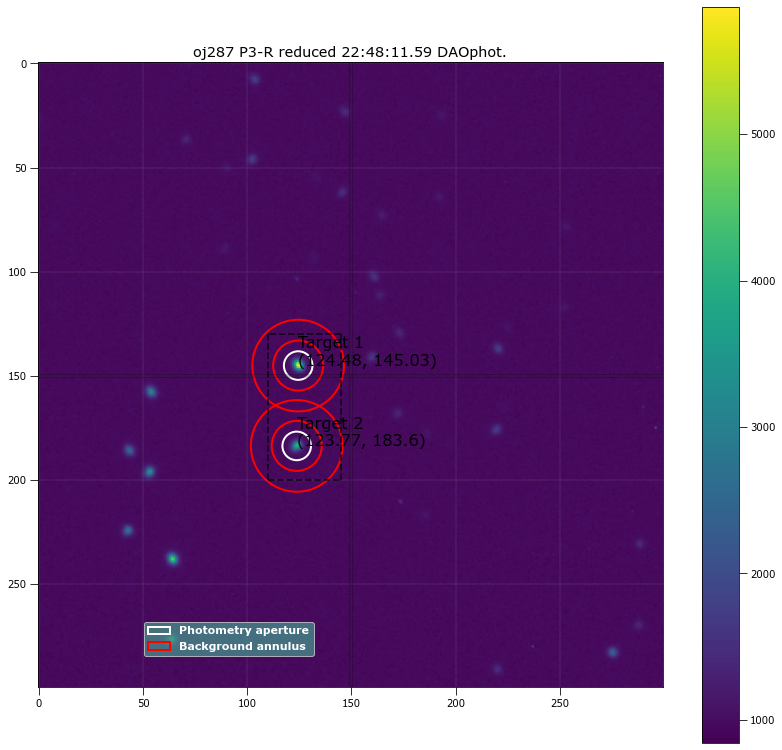

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 124.48311 145.03148 ...          2293.2069        1038409          3178.4333
  2 123.77184 183.59617 ...          1812.8054      1036728.9          3173.1707

 Aperture are: 147.9736224956352 Annulus Area: 1068.1415022205297 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 124.48311 145.03148 ...                 1852.8867             90335.785
  2 123.77184 183.59617 ...                 1373.2143             55341.811

Write this out the excel
201 22:48:11.59 P3-R 120.0 6.863050847457627 124.48310952096429 145.03147776581088 90335.78508938415 1852.8867132617002 

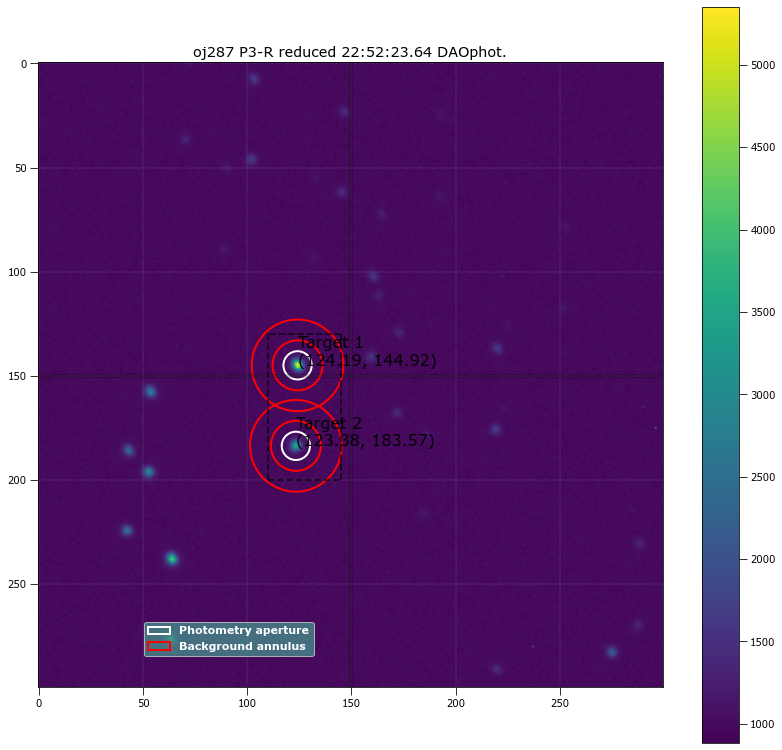

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 124.18544 144.92311 ...          2233.4787      1063891.5          3256.4599
  2 123.37905 183.56916 ...          1793.5869      1063057.1          3253.7507

 Aperture are: 144.64513098082563 Annulus Area: 1068.1415022205297 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 124.18544 144.92311 ...                 1792.4968             88328.783
  2 123.37905 183.56916 ...                 1352.9718             55043.792

Write this out the excel
202 22:52:23.64 P3-R 120.0 6.785423728813559 124.18544328801663 144.92311427327326 88328.78338783479 1792.4968374316334

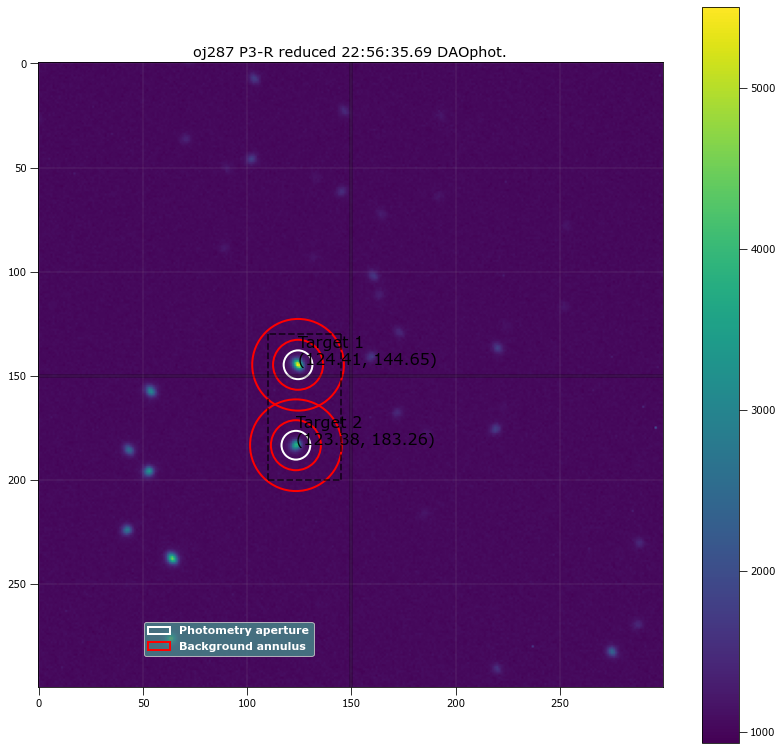

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 124.41342 144.65326 ...          2302.4047      1111556.7          3402.3716
  2 123.38369 183.26384 ...          1865.4979      1110766.5          3399.6944

 Aperture are: 149.65206660928934 Annulus Area: 1068.1415022205297 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 124.41342 144.65326 ...                 1825.7151             87388.337
  2 123.38369 183.26384 ...                 1389.1834             54036.901

Write this out the excel
203 22:56:35.69 P3-R 120.0 6.90186440677966 124.41341737079367 144.65325838442783 87388.33654175806 1825.7150928910808 

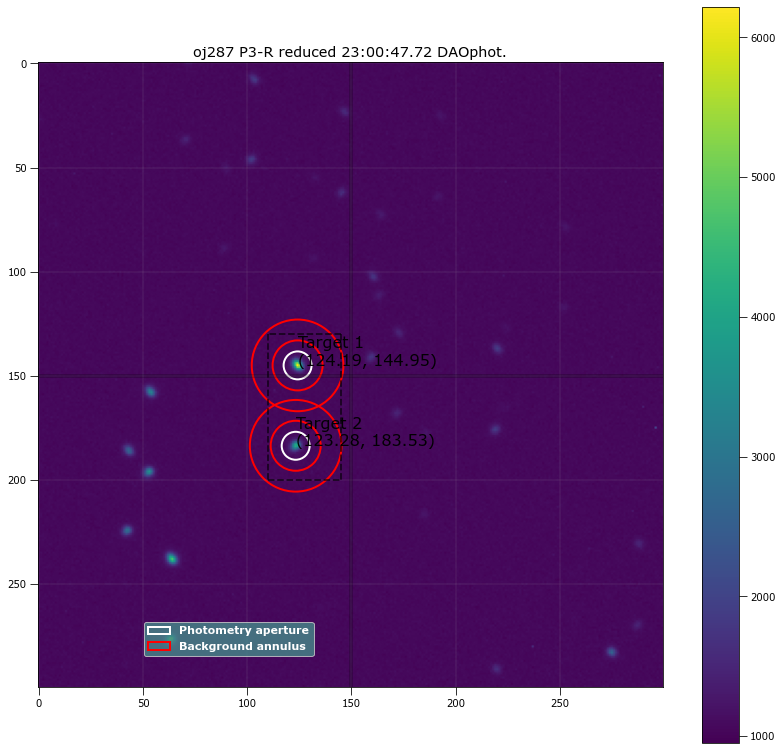

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 124.19278 144.94563 ...          2345.4663      1136759.3          3479.4338
  2  123.2751 183.52842 ...          1881.9764      1135817.1          3476.3309

 Aperture are: 141.35450174934775 Annulus Area: 1068.1415022205297 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 124.19278 144.94563 ...                 1885.0089             86763.079
  2  123.2751 183.52842 ...                 1421.9296             53599.298

Write this out the excel
204 23:00:47.72 P3-R 120.0 6.707796610169492 124.19277866865048 144.94563304121615 86763.07949481084 1885.008887783649 

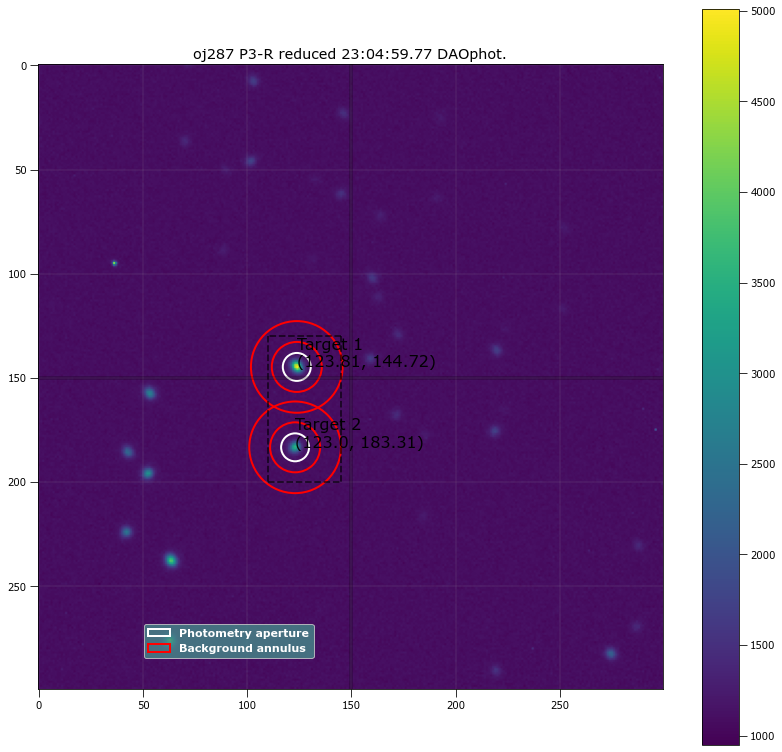

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 123.80521 144.72293 ...          2271.2029        1171513          3585.6757
  2 122.99613 183.31476 ...          1863.2165      1170177.7          3581.4842

 Aperture are: 141.35450174934775 Annulus Area: 1068.1415022205297 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 123.80521 144.72293 ...                 1796.6858             85691.374
  2 122.99613 183.31476 ...                 1389.2541             52892.889

Write this out the excel
205 23:04:59.77 P3-R 120.0 6.707796610169492 123.80520731682194 144.72292910898597 85691.37410889097 1796.6857605334005

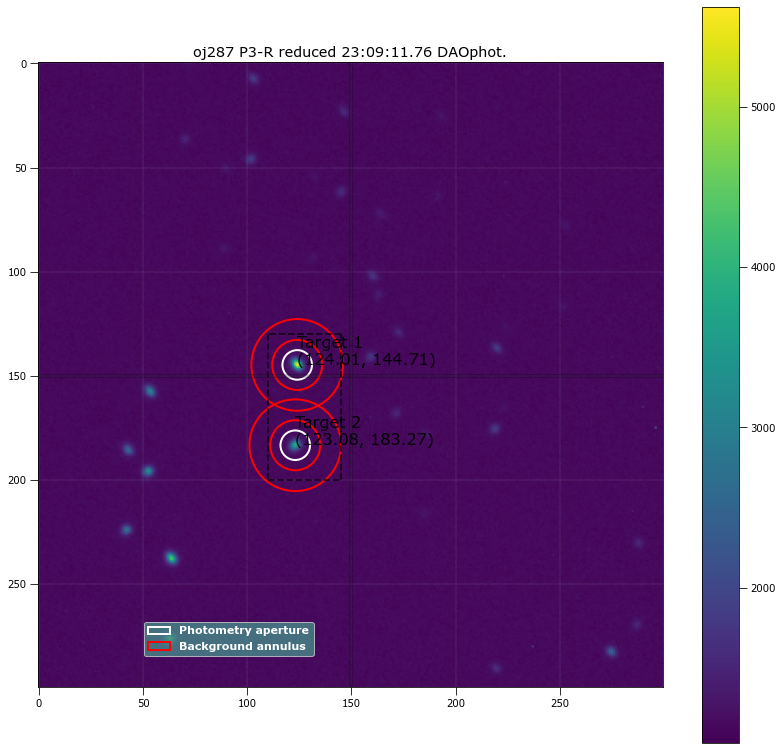

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 124.01447 144.71494 ...          2406.3672      1218283.6          3728.7298
  2 123.07628  183.2705 ...          1990.8858        1220915          3736.7087

 Aperture are: 158.18627074005389 Annulus Area: 1068.1415022205297 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 124.01447 144.71494 ...                 1854.1615             85557.446
  2 123.07628  183.2705 ...                 1437.4984             52855.702

Write this out the excel
206 23:09:11.76 P3-R 120.0 7.095932203389831 124.01447076073202 144.7149400210247 85557.44582473015 1854.1614509582678 

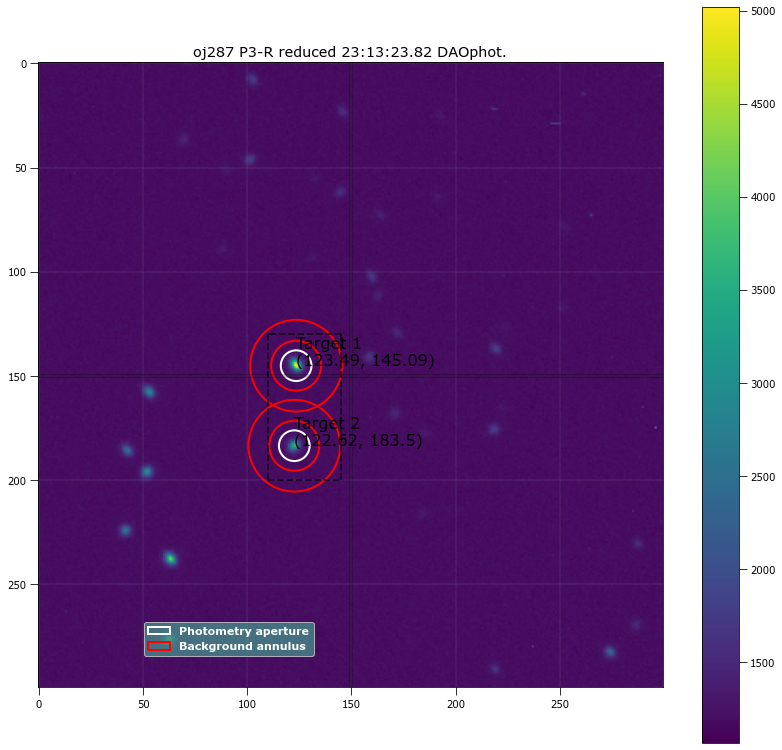

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 123.49255  145.0874 ...          2451.3368      1281102.4          3920.9918
  2 122.61663 183.49756 ...          2073.3233      1280652.4          3919.4817

 Aperture are: 170.5317104981067 Annulus Area: 1068.1415022205297 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 123.49255  145.0874 ...                 1825.3398             84333.329
  2 122.61663 183.49756 ...                 1447.5674             52371.094

Write this out the excel
207 23:13:23.82 P3-R 120.0 7.367627118644068 123.49254510101022 145.08739980234077 84333.32866337823 1825.33977409204 12

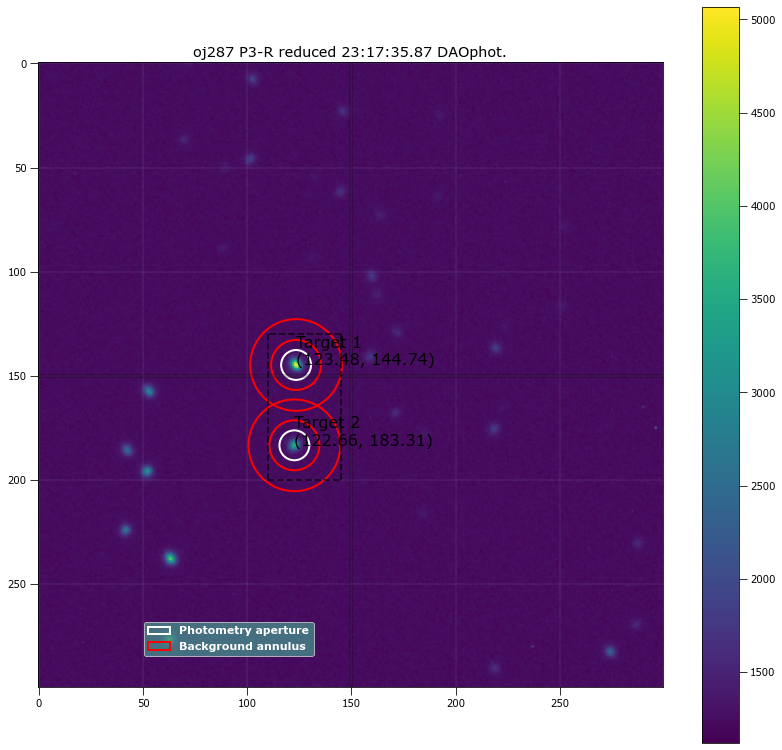

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 123.47682 144.74002 ...          2455.8128      1329357.4          4068.5318
  2 122.65645 183.30684 ...          2080.7358      1326613.9          4060.1155

 Aperture are: 161.6662113881901 Annulus Area: 1068.1415022205297 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 123.47682 144.74002 ...                 1840.0291             82550.487
  2 122.65645 183.30684 ...                 1466.2259             51006.089

Write this out the excel
208 23:17:35.87 P3-R 120.0 7.173559322033898 123.47682036299213 144.74001981644545 82550.48723244036 1840.0291162890405 

In [29]:
#If its too low the threshold is nan. and thats one of the reason it throws a wobbly
#You have to do a manual Fit before you do a physical fit.
#Call it "The split pair, call it the extraordinary ray."
#The pipe!
#we expect 4 targets.. haha sure
#37 doesnt work
#Here is a work around. Incorporate the peak finder into the pipeline and tell the process such that if DAO cannot find the 
#targets, use the peak find coordinates. I suspect the problem is the FWHM.

#P1-R Filter
print("P3-R Filter")

res_apt_sum_list = []

start = 188
end = 209

filename = astropy.io.fits.open(pol_std[start])[0].header['OBJECT']+"_"+astropy.io.fits.open(pol_std[start])[0].header['FILTER']

workbook = xlsxwriter.Workbook('./stats/'+MJD+"_"+ filename+str(start)+"-" +str(end)  +'.xlsx')
worksheet = workbook.add_worksheet()
worksheet.write('A1', 'int')
worksheet.write('B1', 'time obs')
worksheet.write('C1', 'filter')
worksheet.write('D1', 'exptime')
worksheet.write('E1', 'aperture radius')
worksheet.write('F1', 'pol_std 1 x center')
worksheet.write('G1', 'pol_std 1 y center')
worksheet.write('H1', 'pol_std 1 counts')
worksheet.write('I1', 'pol_std 1 error')
worksheet.write('J1', 'pol_std 2 x center')
worksheet.write('K1', 'pol_std 2 y center')
worksheet.write('L1', 'pol_std 2 counts')
worksheet.write('M1', 'pol_std 2 error')
worksheet.write('N1', 'q')
worksheet.write('O1', 'q error')
worksheet.write('P1', 'u')
worksheet.write('Q1', 'u error')
worksheet.write('R1', 'PD')
worksheet.write('S1', 'PD error')
worksheet.write('T1', 'PA')
worksheet.write('U1', 'PA error')

row = 1
column = 0
search_off = 150
siegma_search = 3
search_bracket = [20, 50, 40, -5]

for k in range(start, end ):
    reduced_obj = funcs_calib_and_plot.plot_double_raw_v_reduced(astropy.io.fits.open(pol_std[k]),
                                        [512, 512, 512, 512], 
                                        (m_biast, m_dark, p_3_m_flat), 
                                        False, True, False)

    trial_radii = np.linspace(5, 9.58, num=60)
    pol_std_a = []
    pol_std_b = []
    for radii in trial_radii:
        #Find the position
        DAO_positions = funcs_star_finder.dao_star_finder(reduced_obj, search_bracket, siegma_search, 
                                                          960, search_off, radii, 12 , 22, False, False)
        
        if (len(DAO_positions) != 2):
            x_targ, y_targ, peak_targ  = funcs_polarimetry.source_peak_finder_pol_std(reduced_obj, 4, search_bracket, 950, False, False) #what do I return from this?
            apt_pos = funcs_star_finder.plot_spotted(reduced_obj, search_off, search_bracket , x_targ, y_targ, peak_targ, False, False)
            DAO_positions = funcs_star_finder.peak_to_DAO(apt_pos)        
        
        phot_tab = funcs_apt_phot.apt_phot_local_bkg_sub(reduced_obj, search_off, search_bracket, DAO_positions, radii, 12 , 22, False, False)
        pol_std_a.append(phot_tab['residual_aperture_sum'][0])
        pol_std_b.append(phot_tab['residual_aperture_sum'][1])

    combine_pol_std = [pol_std_a, pol_std_b]
    
    good_radii=funcs_apt_phot.solve_apt(combine_pol_std, trial_radii, False)

    print("Aperture radius for", reduced_obj[0].header['TIME-OBS'],"is", good_radii)
    phot_tab = funcs_apt_phot.apt_phot_local_bkg_sub(reduced_obj, search_off, search_bracket, DAO_positions,good_radii, 12 , 22, True, False)

    res_apt_sum_list.append(phot_tab['residual_aperture_sum'])
    
    print("\nWrite this out the excel")
    print(k, 
          astropy.io.fits.open(pol_std[k])[0].header['TIME-OBS'],
          astropy.io.fits.open(pol_std[k])[0].header['FILTER'],
          astropy.io.fits.open(pol_std[k])[0].header['EXPTIME'],
          good_radii,          
          phot_tab['xcenter'][0].value, phot_tab['ycenter'][0].value,
          phot_tab['residual_aperture_sum'][0], phot_tab['residual_aperture_sum_err'][0],
          phot_tab['xcenter'][1].value, phot_tab['ycenter'][1].value,
          phot_tab['residual_aperture_sum'][1], phot_tab['residual_aperture_sum_err'][1],"\n")
    
    write_this = [k, 
          astropy.io.fits.open(pol_std[k])[0].header['TIME-OBS'],
          astropy.io.fits.open(pol_std[k])[0].header['FILTER'],
          astropy.io.fits.open(pol_std[k])[0].header['EXPTIME'],
          good_radii,
          phot_tab['xcenter'][0].value, phot_tab['ycenter'][0].value,
          phot_tab['residual_aperture_sum'][0], phot_tab['residual_aperture_sum_err'][0],
          phot_tab['xcenter'][1].value, phot_tab['ycenter'][1].value,
          phot_tab['residual_aperture_sum'][1], phot_tab['residual_aperture_sum_err'][1]] #,

    for item in write_this :
        worksheet.write(row, column, item)
        column += 1
        
    column = 0
    row += 1
    
workbook.close()

pol_std_1 = []
pol_std_2 = []

for things in res_apt_sum_list:
    pol_std_1.append(things[0])
    pol_std_2.append(things[1])

In [16]:
#Now I am seeing a case where with the threshold lowered, long compute time I am picking up unwanted background sources
#I'm looking at the example from P1-R
#Target_1
#1 and 2 are posed to be the ordinary ray. One and 2 are post to be the brightest always.